# <font color='blue'> Masters Project Title: </font>

### <font color='blue'> Predicting Customer Lifetime Value In Retail/Banking Based On Customer Behaviour Analysis</font >
_Lucky Mishra (July 2021) Cohort 8_

<font color='blue'> This notebook aims at analyzing the content of an E-commerce database that lists purchases made by $\sim$4000 customers over a period of one year (from 2010/12/01 to 2011/12/09). Based on this analysis, I develop a model that allows to anticipate the purchases that will be made by a new customer, during the following year and this, from its first purchase. <br> </font>



### As part of: Masters in Data Science Dissertation

### Research Questions:
#### `Q1:` *Will it be useful to segment customers by their behavioural pattern?* 
#### `Q2:` *How RFM can be used to derive CLV for new customers?* 
#### `Q3:` *Will predicting customer lifetime monetary value be more beneficial compare to predicting their segments?* 
#### `Q4:` *Which Interpretable methods can be used to explain clustering and regression-based models?*
#### `Q5:` *Are model agnostic methods result trustworthy?* 



##### Dataset downloaded from: https://archive.ics.uci.edu/ml/datasets/Online+Retail+II

#### This file contains following sectios of the overall solution:

#### <font color='blue'>*Experiment 12 - CLV Cohort calculation* </font>
   - 1.1 Split data into 21 months and 3 months
   - 1.2 Generate CLV clusters for first 21 month.
   - 1.3 Generate CLV clusters for 3 months.
   - 1.4 combine the 3months data with 21 months to compare the CLV of the customers   
   - 1.5 Use clusters generated from Experiment 5 using MANUAL RFM calculation and with cancelled orders and run all the selected models.   
   - 1.6 Create a voting classifier by ensemble all the selected classifier to get the best precision.
 
#### <font color='blue'>*Conclusion*</font>

In [1]:
%matplotlib inline
from __future__ import division
from chart_studio import plotly as py 
from crm_rfm_modeling import rfm
from crm_rfm_modeling.rfm import RFM
from datetime import datetime, timedelta,date
from datetime import datetime,timedelta
from IPython.display import display
from IPython.display import display, HTML
from lifetimes.plotting import *
from lifetimes.utils import *
from math import isnan
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import uniform
from pathlib import Path
from plotly.offline import init_notebook_mode,iplot
from random import sample
from scipy.cluster.hierarchy import cut_tree
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage
from sklearn import neighbors, linear_model, svm, tree, ensemble
from sklearn import preprocessing, model_selection, metrics, feature_selection
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.datasets.samples_generator import make_blobs
from sklearn.decomposition import PCA
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV, learning_curve
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
import datetime as dt
import datetime, nltk, warnings
import itertools
import matplotlib
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pandas_profiling as pp
import plotly.graph_objects as go
import plotly.graph_objs as go
import plotly.offline as pyoff
import seaborn as sns
import xgboost as xgb
from xgboost import XGBClassifier,XGBRegressor
from sklearn.metrics import classification_report
from sklearn.ensemble import AdaBoostRegressor
from sklearn import neighbors, linear_model, svm, tree, ensemble
import lightgbm as lgb
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from catboost import CatBoostClassifier
from catboost import CatBoostClassifier
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
import lime
import lime.lime_tabular
from plotnine import ggplot,  geom_line,geom_point, aes, stat_smooth, facet_wrap,scale_x_date,theme,element_text
import plotnine as p9
from plotnine.data import mtcars
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import OneHotEncoder
init_notebook_mode(connected=True)
plt.rcParams["patch.force_edgecolor"] = True
plt.style.use('fivethirtyeight')
mpl.rc('patch', edgecolor = 'dimgray', linewidth=1)
%matplotlib inline
pd. set_option('display.max_columns', None) # or 1000.
pd. set_option('display.max_rows', None) # or 1000.
pd. set_option('display.max_colwidth', -1) # or 199.
warnings.filterwarnings("ignore")

import warnings
warnings.filterwarnings("ignore")

In [2]:
df_rfm =pd.read_excel(open('df_year_2009_2011_clean_with_C.xlsx', 'rb'))

#df_rfm = df_rfm.query("Country=='United Kingdom'").reset_index(drop=True)

grouped_rfm_df =pd.read_excel(open('grouped_rfm_df_with_C.xlsx', 'rb'))

In [3]:
df_model = pd.merge(df_rfm, grouped_rfm_df,  on='Customer ID', how='left')

In [4]:
df_model.count()

Invoice              625508
StockCode            625508
Description          625508
Quantity             625508
InvoiceDate          625508
Price                625508
Customer ID          625508
Country              625508
Revenue              625508
Month                625508
Time                 625508
Year                 625508
Day                  625508
Quarter              625508
Week_Day             625508
BillingMonthYear     625508
Recency              625508
Frequency            625508
Monetary             625508
KMeans_cluster_id    625508
dbscan_label         625508
gmm_cluster_id       625508
dtype: int64

In [5]:
df_model.isnull().sum()

Invoice              0
StockCode            0
Description          0
Quantity             0
InvoiceDate          0
Price                0
Customer ID          0
Country              0
Revenue              0
Month                0
Time                 0
Year                 0
Day                  0
Quarter              0
Week_Day             0
BillingMonthYear     0
Recency              0
Frequency            0
Monetary             0
KMeans_cluster_id    0
dbscan_label         0
gmm_cluster_id       0
dtype: int64

###### <font color='blue'>GMM clustering output is considered to be the best one hence dropping the K-means and DBSCAN output</font>

In [6]:
df_model.drop(['KMeans_cluster_id','dbscan_label'],axis=1, inplace=True)

In [7]:
df_model.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Revenue,Month,Time,Year,Day,Quarter,Week_Day,BillingMonthYear,Recency,Frequency,Monetary,gmm_cluster_id
0,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:44:59.999999,1.25,13085,United Kingdom,30.00,12,07:45:00,2009,1,4,Tuesday,200912,158,59,1064.08,0
1,489434,21871,SAVE THE PLANET MUG,24,2009-12-01 07:44:59.999999,1.25,13085,United Kingdom,30.00,12,07:45:00,2009,1,4,Tuesday,200912,158,59,1064.08,0
2,489435,22350,CAT BOWL,12,2009-12-01 07:46:00.000000,2.55,13085,United Kingdom,30.60,12,07:46:00,2009,1,4,Tuesday,200912,158,59,1064.08,0
3,489435,22353,LUNCHBOX WITH CUTLERY FAIRY CAKES,12,2009-12-01 07:46:00.000000,2.55,13085,United Kingdom,30.60,12,07:46:00,2009,1,4,Tuesday,200912,158,59,1064.08,0
4,489436,21754,HOME BUILDING BLOCK WORD,3,2009-12-01 09:06:00.000001,5.95,13078,United Kingdom,17.85,12,09:06:00,2009,1,4,Tuesday,200912,1,493,7027.10,4


In [8]:
grouped_rfm_df.groupby('gmm_cluster_id')['Customer ID'].count()

gmm_cluster_id
0    2268
1    2058
2    22  
3    747 
4    268 
Name: Customer ID, dtype: int64

### CLV
### Predict the CLV cluster for 90 days 

In [9]:
df_model.columns

Index(['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'Price', 'Customer ID', 'Country', 'Revenue', 'Month', 'Time', 'Year',
       'Day', 'Quarter', 'Week_Day', 'BillingMonthYear', 'Recency',
       'Frequency', 'Monetary', 'gmm_cluster_id'],
      dtype='object')

In [10]:
df_model_Sel=df_model[['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate','Price', 'Customer ID', 'Revenue']]
df_model_Sel['InvoiceDate']= pd.to_datetime(df_model_Sel['InvoiceDate']).dt.date

n_days =90
max_date=df_model_Sel.InvoiceDate.max()
cutoff = max_date- pd.to_timedelta(n_days, unit="d")
print("Cut off Date to seperate the data",cutoff,"\n\n")



Cut off Date to seperate the data 2011-09-10 




###### <font color='blue'>Create Source data after splitting by cutoff day</font> 

In [11]:
df_first_yr =df_model_Sel[df_model_Sel['InvoiceDate']<=cutoff]

<font color='blue'>Create Target data after splitting by cutoff day</font> 

In [12]:
df_sec_yr = df_model_Sel[df_model_Sel['InvoiceDate']>cutoff]

In [13]:
df_first_yr.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Revenue
0,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01,1.25,13085,30.00
1,489434,21871,SAVE THE PLANET MUG,24,2009-12-01,1.25,13085,30.00
2,489435,22350,CAT BOWL,12,2009-12-01,2.55,13085,30.60
3,489435,22353,LUNCHBOX WITH CUTLERY FAIRY CAKES,12,2009-12-01,2.55,13085,30.60
4,489436,21754,HOME BUILDING BLOCK WORD,3,2009-12-01,5.95,13078,17.85


In [14]:
df_first_yr.count()

Invoice        495767
StockCode      495767
Description    495767
Quantity       495767
InvoiceDate    495767
Price          495767
Customer ID    495767
Revenue        495767
dtype: int64

In [15]:
df_sec_yr.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Revenue
495767,566225,22384,LUNCH BAG PINK POLKADOT,6,2011-09-11,1.65,16899,9.90
495768,566225,20725,LUNCH BAG RED RETROSPOT,6,2011-09-11,1.65,16899,9.90
495769,566225,23169,CLASSIC GLASS COOKIE JAR,3,2011-09-11,4.15,16899,12.45
495770,566225,84029E,RED WOOLLY HOTTIE WHITE HEART.,3,2011-09-11,4.25,16899,12.75
495771,566225,21479,WHITE SKULL HOT WATER BOTTLE,3,2011-09-11,4.25,16899,12.75


In [16]:
df_sec_yr.count()

Invoice        129741
StockCode      129741
Description    129741
Quantity       129741
InvoiceDate    129741
Price          129741
Customer ID    129741
Revenue        129741
dtype: int64

In [17]:
def RFM_Features(df, customerID, invoiceDate, transID, sales):
    ''' Create the Recency, Frequency, and Monetary features from the data '''
    # Final date in the data + 1 to create latest date
    latest_date = df[invoiceDate].max() + timedelta(1)
    
    # RFM feature creation
    RFMScores = df.groupby(customerID).agg({invoiceDate: lambda x: (latest_date - x.max()).days, 
                                          transID: lambda x: len(x), sales: lambda x: sum(x)})
    
    # Converting invoiceDate to int since this contains number of days
    RFMScores[invoiceDate] = RFMScores[invoiceDate].astype(int)
    
    # Renaming column names to Recency, Frequency and Monetary
    RFMScores.rename(columns={invoiceDate: 'Recency', transID: 'Frequency', sales: 'Monetary'}, inplace=True)
    
    return RFMScores.reset_index()

Text(0.5, 1.0, '(RFM) Recency')

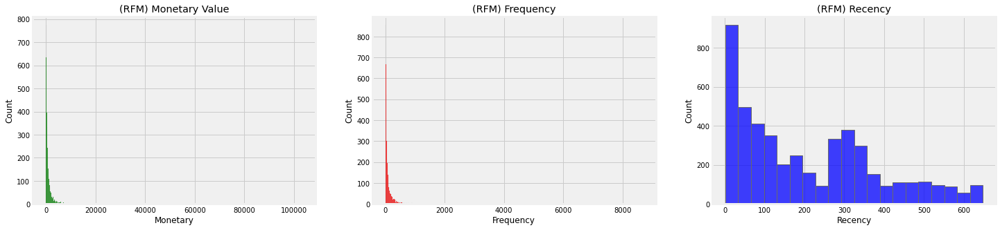

In [18]:
df_first_yr_group = RFM_Features(df=df_first_yr, customerID= "Customer ID", invoiceDate = "InvoiceDate", transID= "Invoice", sales="Revenue")
 

plt.figure(figsize=(30,5))
plt.subplot(141)
sns.histplot(df_first_yr_group["Monetary"], color = "g" )#  , showfliers = False)
plt.title("(RFM) Monetary Value")
plt.subplot(142)
sns.histplot(df_first_yr_group["Frequency"] ,color = "r" )#  , showfliers = False)
plt.title("(RFM) Frequency") 
plt.subplot(143)
sns.histplot(df_first_yr_group["Recency"] ,color = "b" )#  , showfliers = False)
plt.title("(RFM) Recency") 
 

In [19]:
df_first_yr_group.head()

,Customer ID,Recency,Frequency,Monetary
0,12346,341,37,311.37
1,12413,146,22,369.00
2,12426,104,73,1086.86
3,12427,261,8,112.65
4,12437,8,361,5914.65


#### Prepare target  data

In [20]:
df_sec_yr_group = df_sec_yr.groupby('Customer ID')['Revenue'].sum().reset_index()
df_sec_yr_group.columns = ['Customer ID','3mnth_Revenue']

In [21]:
df_sec_yr_group.head()

,Customer ID,3mnth_Revenue
0,12413,176.20
1,12427,262.36
2,12437,1482.48
3,12471,2034.66
4,12472,1082.48


In [22]:
# 2. rescaling
rfm_df_first_temp = df_first_yr_group[['Monetary', 'Frequency', 'Recency']]

# instantiate
scaler = StandardScaler()

# fit_transform
rfm_df_first_scaled = scaler.fit_transform(rfm_df_first_temp)
rfm_df_first_scaled.shape

rfm_df_first_scaled = pd.DataFrame(rfm_df_first_scaled)
rfm_df_first_scaled.columns = ['Monetary', 'Frequency', 'Recency']
rfm_df_first_scaled.head()

,Monetary,Frequency,Recency
0,-0.314916,-0.264771,0.756963
1,-0.291870,-0.324940,-0.356893
2,-0.004800,-0.120363,-0.596800
3,-0.394384,-0.381099,0.299996
4,1.925821,1.034898,-1.145160


In [23]:
#fit the fist year model
X_first = rfm_df_first_scaled[['Monetary', 'Frequency', 'Recency']].values
                              
gmm_first = GaussianMixture(n_components=5,covariance_type='spherical').fit(X_first)
gmm_first_labels = gmm_first.predict(X_first)
score = gmm_first.predict_proba(X_first)
rfm_df_first_scaled['GMM_labels'] = gmm_first_labels

In [24]:
print(silhouette_score(rfm_df_first_scaled,gmm_first_labels))

0.7060828026900252


In [25]:
df_first_yr_group['source_CLV_cluster'] =gmm_first_labels
df_first_yr_group.head(5)

df_first_yr_group.groupby('source_CLV_cluster')['Monetary', 'Frequency', 'Recency'].mean()

,Monetary,Frequency,Recency
source_CLV_cluster,,,
0,240.883896,24.163531,523.396527
1,683.523664,58.095192,84.521612
2,3422.352162,319.801504,74.455639
3,13500.177692,1415.707692,32.261538
4,421.323047,41.082521,312.159790


In [26]:
df_first_yr_group.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster
0,12346,341,37,311.37,4
1,12413,146,22,369.00,1
2,12426,104,73,1086.86,1
3,12427,261,8,112.65,4
4,12437,8,361,5914.65,2


<AxesSubplot:xlabel='source_CLV_cluster', ylabel='Recency'>

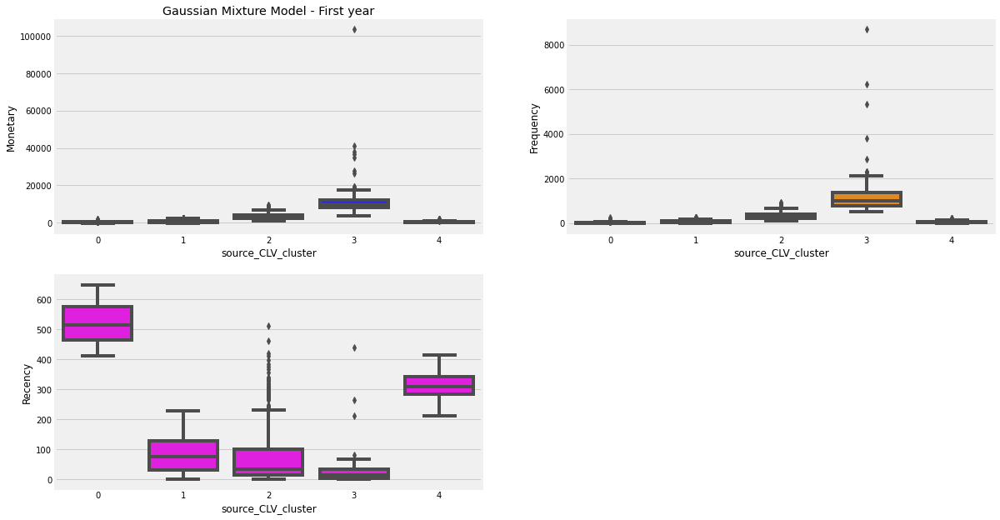

In [27]:
plt.figure(figsize=(18,16))
plt.subplot(3,2,1)
sns.boxplot(x='source_CLV_cluster', y='Monetary', data=df_first_yr_group,color="blue")
plt.title("Gaussian Mixture Model - First year")

plt.subplot(3,2,2)
sns.boxplot(x='source_CLV_cluster', y='Frequency', data=df_first_yr_group,color="darkorange") 

plt.subplot(3,2,3)
sns.boxplot(x='source_CLV_cluster', y='Recency', data=df_first_yr_group,color="fuchsia")

In [28]:
df_first_sec_yr_group = pd.merge(df_first_yr_group, df_sec_yr_group, on='Customer ID', how='left')

In [29]:
df_first_sec_yr_group = df_first_sec_yr_group.fillna(0)

In [30]:
df_first_sec_yr_group.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue
0,12346,341,37,311.37,4,0.00
1,12413,146,22,369.00,1,176.20
2,12426,104,73,1086.86,1,0.00
3,12427,261,8,112.65,4,262.36
4,12437,8,361,5914.65,2,1482.48


In [31]:
# 2. rescaling
rfm_df_sec_temp = df_first_sec_yr_group[['Frequency', 'Recency','3mnth_Revenue']]

# instantiate
scaler = StandardScaler()

# fit_transform
rfm_df_sec_scaled = scaler.fit_transform(rfm_df_sec_temp)
rfm_df_sec_scaled.shape

rfm_df_sec_scaled = pd.DataFrame(rfm_df_sec_temp)
rfm_df_sec_scaled.columns = [ 'Frequency', 'Recency','3mnth_Revenue']
rfm_df_sec_scaled.head()

,Frequency,Recency,3mnth_Revenue
0,37,341,0.00
1,22,146,176.20
2,73,104,0.00
3,8,261,262.36
4,361,8,1482.48


In [32]:
#fit the sec year model
X_Sec = rfm_df_sec_scaled[[ 'Frequency', 'Recency','3mnth_Revenue']].values
                              
gmm_sec = GaussianMixture(n_components=5,covariance_type='spherical').fit(X_Sec)
gmm_sec_labels = gmm_sec.predict(X_Sec)

score = gmm_sec.predict_proba(X_Sec)
rfm_df_sec_scaled['GMM_labels_6m'] = gmm_sec_labels

In [33]:
print(silhouette_score(rfm_df_sec_scaled,gmm_sec_labels))

0.5076898200701312


In [34]:
df_first_sec_yr_group['target_CLV_cluster'] =gmm_sec_labels
df_first_sec_yr_group.head(5)

df_first_sec_yr_group.groupby('target_CLV_cluster')['3mnth_Revenue', 'Frequency', 'Recency'].mean()

,3mnth_Revenue,Frequency,Recency
target_CLV_cluster,,,
0,42.363396,53.623192,245.476165
1,3678.621429,1991.095238,23.571429
2,32321.220000,3133.000000,1.000000
3,1290.388057,437.197880,57.579505
4,542.825563,160.067270,90.576973


In [35]:
df_first_sec_yr_group.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster
0,12346,341,37,311.37,4,0.00,0
1,12413,146,22,369.00,1,176.20,0
2,12426,104,73,1086.86,1,0.00,0
3,12427,261,8,112.65,4,262.36,0
4,12437,8,361,5914.65,2,1482.48,3


In [36]:
df_first_sec_yr_group.groupby('source_CLV_cluster')['Customer ID'].count()

source_CLV_cluster
0    691 
1    2059
2    665 
3    65  
4    1333
Name: Customer ID, dtype: int64

## Model building

In [37]:
X = df_first_sec_yr_group.drop(['target_CLV_cluster','3mnth_Revenue'],axis=1)
y = df_first_sec_yr_group['target_CLV_cluster']

### XGBOOST

###### Common methods

In [38]:
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Oranges):
   
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
        
    #_________________________________________________
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)
    #_________________________________________________
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black",weight='bold', fontsize=18)
    #_________________________________________________
    plt.tight_layout()
    plt.ylabel('True label',weight='bold', fontsize=18)
    plt.xlabel('Predicted label',weight='bold', fontsize=18)
    
    
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 10)):
   
    """Generate a simple plot of the test and training learning curve"""
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="lime")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="red")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="lime", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="red", label="Cross-validation score")

    plt.legend(loc="best")
    return plt

def model_auc(model): 
    
    train_auc = roc_auc_score(y_train, model.predict_proba(X_train)[:, 1])
    val_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f'Train AUC: {train_auc}, Val Auc: {val_auc}')
    
class Class_Fit(object):
    def __init__(self, clf, params=None):
        if params:            
            
            self.clf = clf(**params)
        else:
           
            self.clf = clf()

    def train(self, x_train, y_train):
        self.clf.fit(x_train, y_train)

    def predict(self, x):
        return self.clf.predict(x)
    
    def grid_search(self, parameters, Kfold):
        self.grid = GridSearchCV(estimator = self.clf, param_grid = parameters, cv = Kfold)
        
    def grid_fit(self, X, Y):
        self.grid.fit(X, Y)
        
    def grid_predict(self, X, Y):
        self.predictions = self.grid.predict(X)
        print("Precision: {:.2f} % ".format(100*metrics.accuracy_score(Y, self.predictions)))  
        
    def train_score(self, X, Y,message):
        print(message.format(self.grid.score(X, Y)))
 
    
    def test_score(self, X, Y,message):
         print(message.format(self.grid.score(X, Y)))
              
      

In [39]:
X.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster
0,12346,341,37,311.37,4
1,12413,146,22,369.00,1
2,12426,104,73,1086.86,1
3,12427,261,8,112.65,4
4,12437,8,361,5914.65,2


In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)

In [41]:
X_train.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster
3886,17198,275,63,256.61,4
2620,15727,17,581,6151.01,2
2008,14995,190,35,100.71,1
4774,18245,59,380,4835.69,2
4632,18078,127,60,341.33,1


In [42]:
y_prob = df_first_sec_yr_group["target_CLV_cluster"]
xgb_clf_spec = XGBClassifier( objective="multi:softprob", random_state =123 ,eval_metric='mlogloss')

ltv_xgb_model = GridSearchCV(estimator= xgb_clf_spec,param_grid= dict(learning_rate=[ 0.01,0.1,0.3,0.5] ), \
                             refit= True, cv=5  )

ltv_xgb_model.fit(X,y_prob)


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     eval_metric='mlogloss', gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None,
                                     objective='multi:softprob',
                                     random_state=123, reg_alpha=None,
                      

In [43]:
y_pred = ltv_xgb_model.predict(X_test)
y_pred1 = ltv_xgb_model.predict(X_train)

In [44]:
score_list=[]
from sklearn.metrics import precision_score,recall_score,f1_score,accuracy_score

score_list.append('XGB classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('XGB classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('XGB classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('XGB classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

In [45]:
score_list

['XGB classifier Precision on training set: 0.87 & test data 0.88',
 'XGB classifier Recall    on training set: 0.88 & test data 0.88',
 'XGB classifier F1 score  on training set: 0.87 & test data 0.87',
 'XGB classifier Accuracy  on training set: 0.88 & test data 0.88']

In [46]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.98      0.93      1125
           1       1.00      1.00      1.00         6
           3       0.94      0.57      0.71        87
           4       0.76      0.50      0.60       226

    accuracy                           0.88      1444
   macro avg       0.90      0.76      0.81      1444
weighted avg       0.88      0.88      0.87      1444



In [47]:
print(confusion_matrix(y_test,y_pred))

[[1103    0    1   21]
 [   0    6    0    0]
 [  23    0   50   14]
 [ 111    0    2  113]]


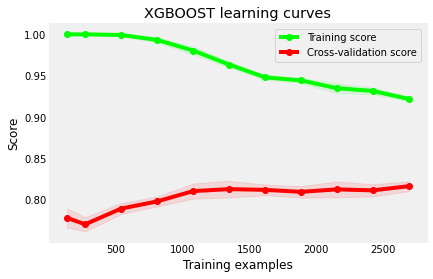

In [48]:

g = plot_learning_curve(ltv_xgb_model.best_estimator_,
                        "XGBOOST learning curves", X_train, y_train, 
                        cv = 5,  train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5,
                                                0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


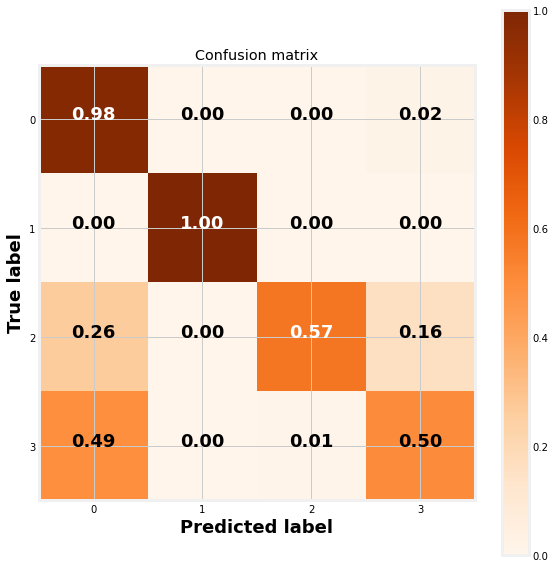

In [49]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

___
### Support Vector Machine Classifier (SVC)

In [50]:
svc = Class_Fit(clf = svm.LinearSVC)
svc.grid_search(parameters = [{'C':np.logspace(-2,2,10)}], Kfold = 5)

In [51]:
svc.grid_fit(X = X_train, Y = y_train)

In [52]:
svc.grid_predict(X_test, y_test)
y_pred=svc.predictions
svc.grid_predict(X_train, y_train)
y_pred1=svc.predictions

Precision: 80.26 % 
Precision: 80.71 % 


In [53]:
print('Svc classifier Precision on training set: {:.2f} and test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

Svc classifier Precision on training set: 0.76 and test data 0.75


In [54]:
score_list.append('Svc classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('Svc classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('Svc classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('Svc classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))


Normalized confusion matrix


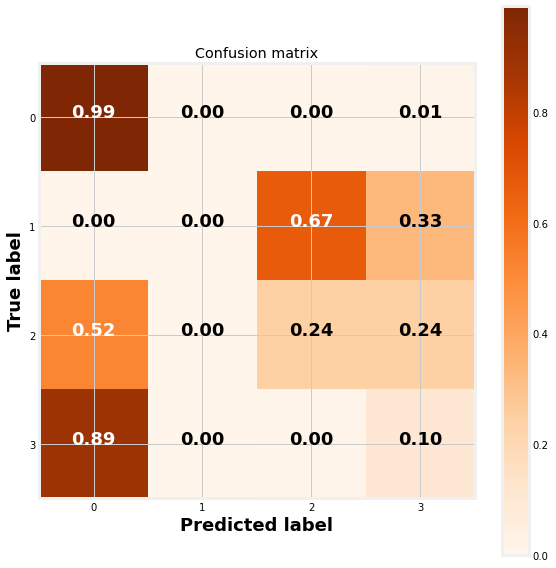

In [55]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [56]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.82      0.99      0.90      1125
           1       0.00      0.00      0.00         6
           3       0.75      0.24      0.37        87
           4       0.43      0.10      0.16       226

    accuracy                           0.80      1444
   macro avg       0.50      0.33      0.36      1444
weighted avg       0.75      0.80      0.75      1444



In [57]:
print(confusion_matrix(y_test,y_pred))

[[1115    0    2    8]
 [   0    0    4    2]
 [  45    0   21   21]
 [ 202    0    1   23]]


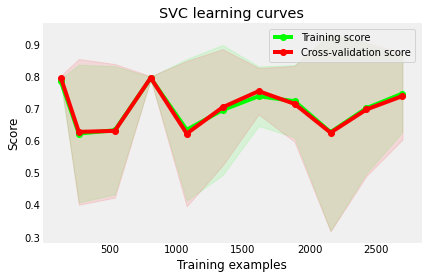

In [58]:
g = plot_learning_curve(svc.grid.best_estimator_,
                        "SVC learning curves", X_train, y_train,  
                        cv = 5,  train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5,0.6, 0.7, 0.8, 0.9, 1])

On this curve, we can see that the train and cross-validation curves converge towards the same limit when the sample size increases. This is typical of modeling with low variance and proves that the model does not suffer from overfitting. Also, we can see that the accuracy of the training curve is correct which is synonymous of a low bias. Hence the model does not underfit the data.

___
###  Logistic Regression

 

In [59]:
lr = Class_Fit(clf = linear_model.LogisticRegression)
lr.grid_search(parameters = [{'C':np.logspace(-2,2,20)}], Kfold = 5)
lr.grid_fit(X = X_train, Y = y_train)
lr.grid_predict(X_test, y_test)

Precision: 82.13 % 


In [60]:
lr.grid_predict(X_test, y_test)
y_pred=lr.predictions
lr.grid_predict(X_train, y_train)
y_pred1=lr.predictions


score_list.append('LR classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('LR classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('LR classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('LR classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))


Precision: 82.13 % 
Precision: 82.61 % 


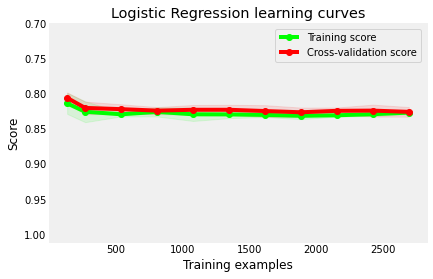

In [61]:
g = plot_learning_curve(lr.grid.best_estimator_, "Logistic Regression learning curves", X_train, y_train,
                        ylim = [1.01, 0.7], cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


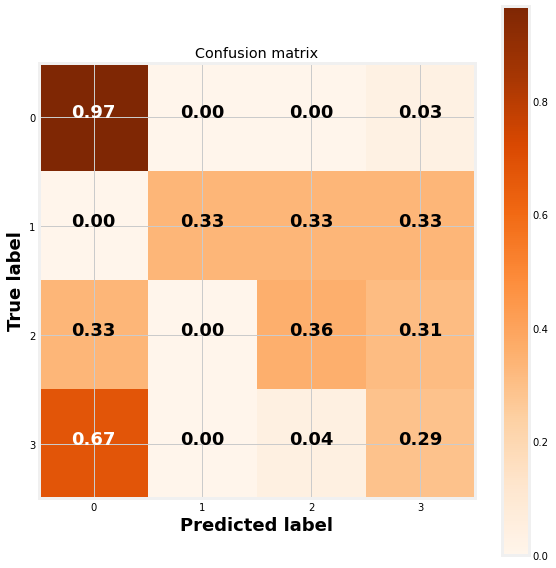

In [62]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [63]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.97      0.91      1125
           1       1.00      0.33      0.50         6
           3       0.70      0.36      0.47        87
           4       0.50      0.29      0.37       226

    accuracy                           0.82      1444
   macro avg       0.77      0.49      0.56      1444
weighted avg       0.79      0.82      0.80      1444



In [64]:
print(confusion_matrix(y_test,y_pred))

[[1088    0    2   35]
 [   0    2    2    2]
 [  29    0   31   27]
 [ 152    0    9   65]]


### Decision Tree

In [65]:
tr = Class_Fit(clf = tree.DecisionTreeClassifier)
tr.grid_search(parameters = [{'criterion' : ['entropy', 'gini'], 'max_features' :['sqrt', 'log2']}], Kfold =5)
tr.grid_fit(X = X_train, Y = y_train)
tr.grid_predict(X_test, y_test)

Precision: 73.48 % 


In [66]:
tr.grid_predict(X_test, y_test)
y_pred=tr.predictions
tr.grid_predict(X_train, y_train)
y_pred1=tr.predictions

 
score_list.append('DT classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('DT classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('DT classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('DT classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 73.48 % 
Precision: 100.00 % 


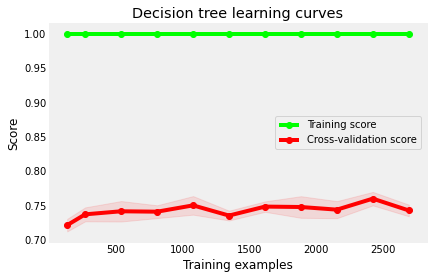

In [67]:
g = plot_learning_curve(tr.grid.best_estimator_, "Decision tree learning curves", X_train,y_train,
                          cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


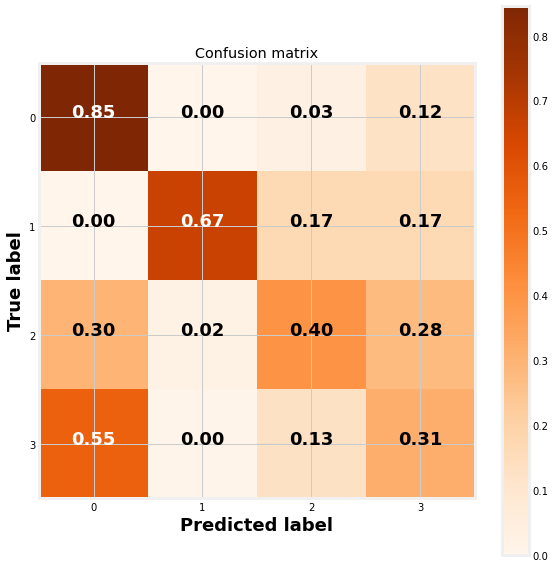

In [68]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [69]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.85      0.85      1125
           1       0.57      0.67      0.62         6
           3       0.35      0.40      0.37        87
           4       0.30      0.31      0.31       226

    accuracy                           0.73      1444
   macro avg       0.52      0.56      0.54      1444
weighted avg       0.74      0.73      0.74      1444



In [70]:
print(confusion_matrix(y_test,y_pred))

[[951   0  36 138]
 [  0   4   1   1]
 [ 26   2  35  24]
 [125   1  29  71]]


### Random Forest

In [71]:
rf = Class_Fit(clf = ensemble.RandomForestClassifier)
param_grid = {'criterion' : ['entropy', 'gini'], 'n_estimators' : [20, 40, 60, 80, 100],
               'max_features' :['sqrt', 'log2']}
rf.grid_search(parameters = param_grid, Kfold = 5)
rf.grid_fit(X = X_train, Y = y_train)
rf.grid_predict(X_test, y_test)

Precision: 81.16 % 


In [72]:
rf.grid_predict(X_train, y_train)

Precision: 100.00 % 


In [73]:
rf.grid_predict(X_test, y_test)
y_pred=rf.predictions
rf.grid_predict(X_train, y_train)
y_pred1=rf.predictions
 
score_list.append('RF classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('RF classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('RF classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('RF classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 81.16 % 
Precision: 100.00 % 


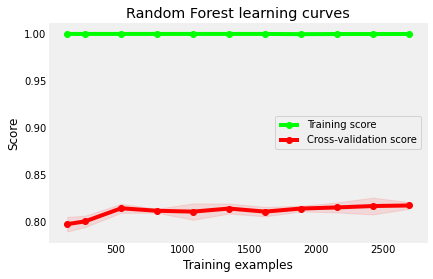

In [74]:
g = plot_learning_curve(rf.grid.best_estimator_, "Random Forest learning curves", X_train, y_train,
                         cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


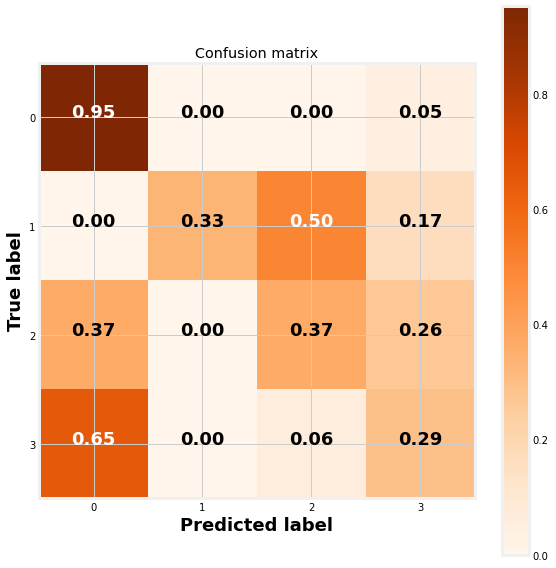

In [75]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [76]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.95      0.90      1125
           1       1.00      0.33      0.50         6
           3       0.64      0.37      0.47        87
           4       0.47      0.29      0.36       226

    accuracy                           0.81      1444
   macro avg       0.74      0.49      0.56      1444
weighted avg       0.78      0.81      0.79      1444



In [77]:
print(confusion_matrix(y_test,y_pred))

[[1072    0    2   51]
 [   0    2    3    1]
 [  32    0   32   23]
 [ 147    0   13   66]]


### AdaBoost Classifier

In [78]:
ada = Class_Fit(clf = AdaBoostClassifier)
param_grid = {'n_estimators' : [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
ada.grid_search(parameters = param_grid, Kfold = 5)
ada.grid_fit(X = X_train, Y = y_train)
ada.grid_predict(X_test,y_test)

Precision: 79.85 % 


In [79]:
ada.grid_predict(X_test, y_test)
y_pred=ada.predictions
ada.grid_predict(X_train, y_train)
y_pred1=ada.predictions

 
score_list.append('Adabost classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('Adabost classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('Adabost classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('Adabost classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 79.85 % 
Precision: 79.43 % 


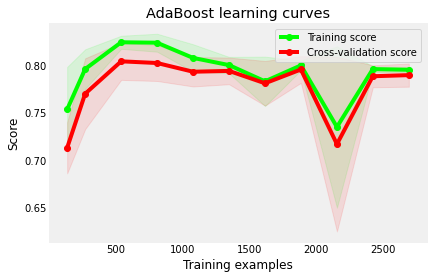

In [80]:
g = plot_learning_curve(ada.grid.best_estimator_, "AdaBoost learning curves", X_train, y_train,
                       cv = 5, train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


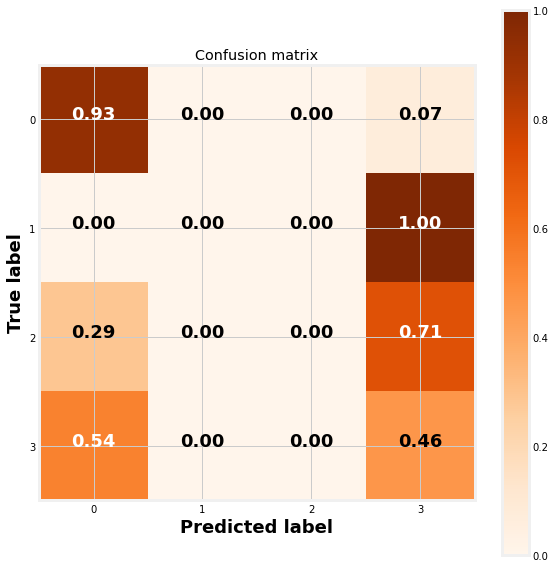

In [81]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [82]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.93      0.90      1125
           1       0.00      0.00      0.00         6
           3       0.00      0.00      0.00        87
           4       0.42      0.46      0.44       226

    accuracy                           0.80      1444
   macro avg       0.32      0.35      0.34      1444
weighted avg       0.75      0.80      0.77      1444



In [83]:
print(confusion_matrix(y_test,y_pred))

[[1048    0    0   77]
 [   0    0    0    6]
 [  25    0    0   62]
 [ 121    0    0  105]]


### Gradient Boosting Classifier

In [84]:
gb = Class_Fit(clf = ensemble.GradientBoostingClassifier)
param_grid = {'n_estimators' : [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
gb.grid_search(parameters = param_grid, Kfold = 5)
gb.grid_fit(X = X_train, Y = y_train)
gb.grid_predict(X_test, y_test)

Precision: 82.13 % 


In [85]:
gb.grid_predict(X_test, y_test)
y_pred=gb.predictions
gb.grid_predict(X_train, y_train)
y_pred1=gb.predictions
 
score_list.append('GB classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('GB classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('GB classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('GB classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 82.13 % 
Precision: 84.09 % 


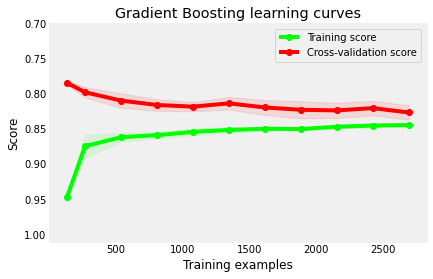

In [86]:
g = plot_learning_curve(gb.grid.best_estimator_, "Gradient Boosting learning curves", X_train, y_train,
                        ylim = [1.01, 0.7], cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


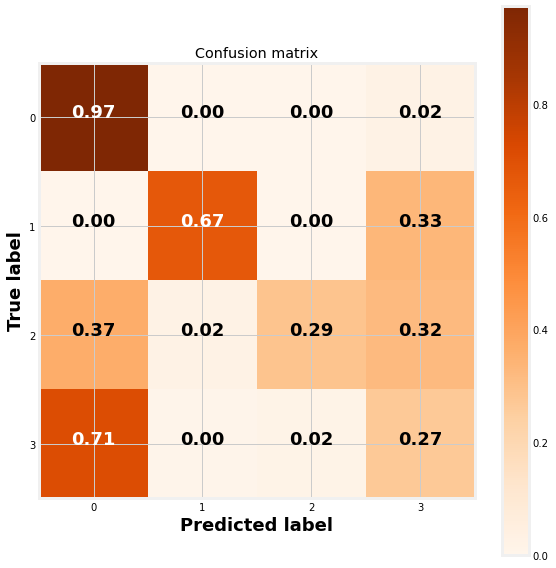

In [87]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=1)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [88]:
print (classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.85      0.97      0.91      1125
           1       0.57      0.67      0.62         6
           3       0.83      0.29      0.43        87
           4       0.51      0.27      0.35       226

    accuracy                           0.82      1444
   macro avg       0.69      0.55      0.58      1444
weighted avg       0.80      0.82      0.79      1444



In [89]:
print(confusion_matrix(y_test,y_pred))

[[1096    0    1   28]
 [   0    4    0    2]
 [  32    2   25   28]
 [ 160    1    4   61]]


###  k-Nearest Neighbors

In [90]:

from sklearn import neighbors, linear_model, svm, tree, ensemble


knn = Class_Fit(clf = neighbors.KNeighborsClassifier)
knn.grid_search(parameters = [{'n_neighbors': np.arange(1,50,1)}], Kfold = 5)
knn.grid_fit(X = X_train, Y = y_train)
knn.grid_predict(X_test, y_test)

Precision: 81.09 % 


In [91]:
knn.grid_predict(X_test, y_test)
y_pred=knn.predictions
knn.grid_predict(X_train, y_train)
y_pred1=knn.predictions

 
score_list.append('knn classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('knn classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('knn classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('knn classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 81.09 % 
Precision: 81.89 % 


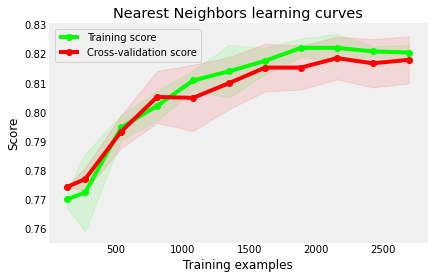

In [92]:
g = plot_learning_curve(knn.grid.best_estimator_, "Nearest Neighbors learning curves", X_train, y_train,
                       cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


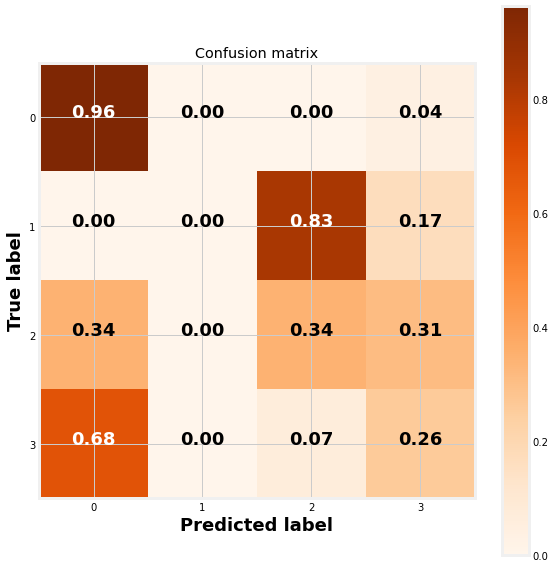

In [93]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=1)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [94]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.96      0.91      1125
           1       0.00      0.00      0.00         6
           3       0.59      0.34      0.43        87
           4       0.46      0.26      0.33       226

    accuracy                           0.81      1444
   macro avg       0.48      0.39      0.42      1444
weighted avg       0.77      0.81      0.78      1444



In [95]:
print(confusion_matrix(y_test,y_pred))

[[1083    0    1   41]
 [   0    0    5    1]
 [  30    0   30   27]
 [ 153    0   15   58]]


### Light BM

In [96]:
# build the lightgbm model

lbm = Class_Fit(clf = lgb.LGBMClassifier)
param_grid = {'learning_rate':[0.1],'num_leaves':[31],'n_estimators' : [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}

lbm.grid_search(parameters = param_grid, Kfold = 5)
lbm.grid_fit(X = X_train, Y = y_train)
lbm.grid_predict(X_test,y_test)

Precision: 81.79 % 


In [97]:
lbm.grid_predict(X_test, y_test)
y_pred=lbm.predictions
lbm.grid_predict(X_train, y_train)
y_pred1=lbm.predictions

score_list.append('Light BM  classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('Light BM  classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('Light BM  classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('Light BM  classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 81.79 % 
Precision: 85.31 % 


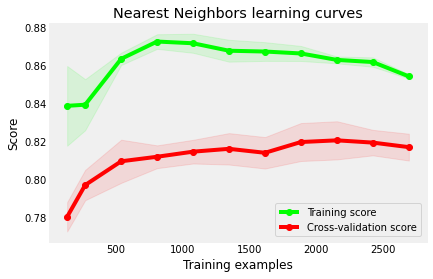

In [98]:
g = plot_learning_curve(lbm.grid.best_estimator_, "Nearest Neighbors learning curves", X_train, y_train,
                         cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


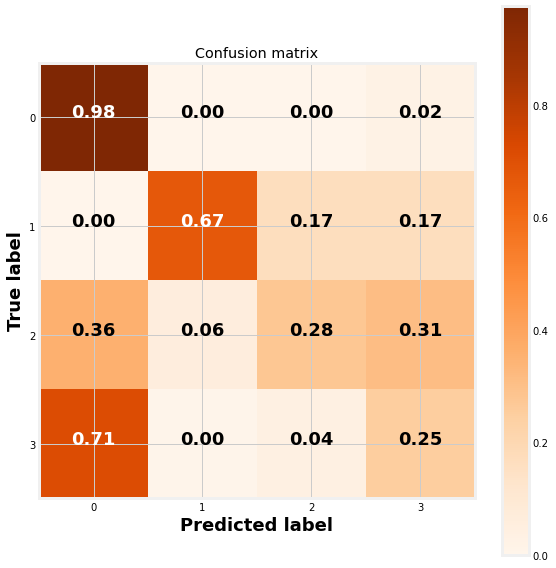

In [99]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=1)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [100]:

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91      1125
           1       0.40      0.67      0.50         6
           3       0.71      0.28      0.40        87
           4       0.50      0.25      0.33       226

    accuracy                           0.82      1444
   macro avg       0.62      0.54      0.53      1444
weighted avg       0.79      0.82      0.79      1444



In [101]:
print(confusion_matrix(y_test,y_pred))

[[1097    0    1   27]
 [   0    4    1    1]
 [  31    5   24   27]
 [ 161    1    8   56]]


### Catboost

In [102]:
catb = Class_Fit(clf =CatBoostClassifier)
param_grid = {'n_estimators' : [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}

catb.grid_search(parameters = param_grid, Kfold = 5)
catb.grid_fit(X = X_train, Y = y_train)
catb.grid_predict(X_test,y_test)

Learning rate set to 0.5
0:	learn: 0.7393806	total: 56.5ms	remaining: 509ms
1:	learn: 0.6043377	total: 59.7ms	remaining: 239ms
2:	learn: 0.5370853	total: 64.2ms	remaining: 150ms
3:	learn: 0.4997343	total: 68.6ms	remaining: 103ms
4:	learn: 0.4757131	total: 73.1ms	remaining: 73.1ms
5:	learn: 0.4558409	total: 78ms	remaining: 52ms
6:	learn: 0.4445240	total: 82.1ms	remaining: 35.2ms
7:	learn: 0.4368572	total: 86.2ms	remaining: 21.5ms
8:	learn: 0.4308454	total: 90.9ms	remaining: 10.1ms
9:	learn: 0.4260512	total: 95.3ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7403350	total: 5.86ms	remaining: 52.8ms
1:	learn: 0.6127154	total: 8.92ms	remaining: 35.7ms
2:	learn: 0.5474820	total: 14ms	remaining: 32.6ms
3:	learn: 0.5087707	total: 18.5ms	remaining: 27.8ms
4:	learn: 0.4842700	total: 22.5ms	remaining: 22.5ms
5:	learn: 0.4682140	total: 26.8ms	remaining: 17.8ms
6:	learn: 0.4573158	total: 31.6ms	remaining: 13.5ms
7:	learn: 0.4482740	total: 36.2ms	remaining: 9.04ms
8:	learn: 0.4426005	total: 

8:	learn: 0.4308454	total: 41.3ms	remaining: 96.4ms
9:	learn: 0.4260512	total: 46.1ms	remaining: 92.2ms
10:	learn: 0.4197328	total: 50.2ms	remaining: 86.7ms
11:	learn: 0.4163180	total: 54.3ms	remaining: 81.5ms
12:	learn: 0.4115918	total: 59.6ms	remaining: 77.9ms
13:	learn: 0.4075696	total: 63.9ms	remaining: 73ms
14:	learn: 0.4037976	total: 68ms	remaining: 68ms
15:	learn: 0.4009627	total: 72.5ms	remaining: 63.4ms
16:	learn: 0.3984946	total: 76.8ms	remaining: 58.7ms
17:	learn: 0.3947105	total: 80.7ms	remaining: 53.8ms
18:	learn: 0.3912106	total: 84.9ms	remaining: 49.2ms
19:	learn: 0.3875020	total: 89.5ms	remaining: 44.7ms
20:	learn: 0.3835988	total: 93.8ms	remaining: 40.2ms
21:	learn: 0.3815795	total: 97.9ms	remaining: 35.6ms
22:	learn: 0.3780499	total: 102ms	remaining: 31ms
23:	learn: 0.3744458	total: 107ms	remaining: 26.8ms
24:	learn: 0.3710315	total: 111ms	remaining: 22.3ms
25:	learn: 0.3669830	total: 115ms	remaining: 17.8ms
26:	learn: 0.3649267	total: 120ms	remaining: 13.3ms
27:	lear

20:	learn: 0.3835988	total: 95.4ms	remaining: 86.3ms
21:	learn: 0.3815795	total: 99.9ms	remaining: 81.7ms
22:	learn: 0.3780499	total: 104ms	remaining: 77.1ms
23:	learn: 0.3744458	total: 109ms	remaining: 72.8ms
24:	learn: 0.3710315	total: 114ms	remaining: 68.4ms
25:	learn: 0.3669830	total: 118ms	remaining: 63.6ms
26:	learn: 0.3649267	total: 122ms	remaining: 58.8ms
27:	learn: 0.3635857	total: 127ms	remaining: 54.3ms
28:	learn: 0.3599161	total: 131ms	remaining: 49.7ms
29:	learn: 0.3567601	total: 135ms	remaining: 45ms
30:	learn: 0.3539284	total: 139ms	remaining: 40.4ms
31:	learn: 0.3509188	total: 144ms	remaining: 36ms
32:	learn: 0.3487613	total: 148ms	remaining: 31.4ms
33:	learn: 0.3473907	total: 152ms	remaining: 26.9ms
34:	learn: 0.3458807	total: 157ms	remaining: 22.4ms
35:	learn: 0.3427392	total: 161ms	remaining: 17.9ms
36:	learn: 0.3411223	total: 165ms	remaining: 13.4ms
37:	learn: 0.3394584	total: 169ms	remaining: 8.89ms
38:	learn: 0.3364483	total: 173ms	remaining: 4.44ms
39:	learn: 0.3

21:	learn: 0.3837368	total: 99.9ms	remaining: 81.7ms
22:	learn: 0.3799256	total: 104ms	remaining: 76.7ms
23:	learn: 0.3772404	total: 108ms	remaining: 71.8ms
24:	learn: 0.3748232	total: 112ms	remaining: 67.3ms
25:	learn: 0.3721325	total: 116ms	remaining: 62.6ms
26:	learn: 0.3693419	total: 120ms	remaining: 57.8ms
27:	learn: 0.3664453	total: 124ms	remaining: 53.2ms
28:	learn: 0.3636420	total: 129ms	remaining: 48.7ms
29:	learn: 0.3608929	total: 133ms	remaining: 44.2ms
30:	learn: 0.3569105	total: 137ms	remaining: 39.7ms
31:	learn: 0.3550345	total: 141ms	remaining: 35.2ms
32:	learn: 0.3518730	total: 145ms	remaining: 30.9ms
33:	learn: 0.3508374	total: 150ms	remaining: 26.5ms
34:	learn: 0.3481777	total: 154ms	remaining: 22.1ms
35:	learn: 0.3468297	total: 159ms	remaining: 17.7ms
36:	learn: 0.3442090	total: 164ms	remaining: 13.3ms
37:	learn: 0.3423037	total: 168ms	remaining: 8.82ms
38:	learn: 0.3404346	total: 173ms	remaining: 4.42ms
39:	learn: 0.3382691	total: 177ms	remaining: 0us
Learning rate 

40:	learn: 0.3446185	total: 176ms	remaining: 38.6ms
41:	learn: 0.3420441	total: 181ms	remaining: 34.4ms
42:	learn: 0.3392940	total: 185ms	remaining: 30.1ms
43:	learn: 0.3374942	total: 189ms	remaining: 25.8ms
44:	learn: 0.3364671	total: 193ms	remaining: 21.5ms
45:	learn: 0.3342835	total: 198ms	remaining: 17.2ms
46:	learn: 0.3320731	total: 202ms	remaining: 12.9ms
47:	learn: 0.3295157	total: 206ms	remaining: 8.58ms
48:	learn: 0.3272858	total: 210ms	remaining: 4.29ms
49:	learn: 0.3262958	total: 215ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7367431	total: 8.24ms	remaining: 404ms
1:	learn: 0.6065394	total: 10.9ms	remaining: 263ms
2:	learn: 0.5440301	total: 14.8ms	remaining: 233ms
3:	learn: 0.5033395	total: 19.4ms	remaining: 224ms
4:	learn: 0.4786251	total: 25.4ms	remaining: 229ms
5:	learn: 0.4636135	total: 30.6ms	remaining: 224ms
6:	learn: 0.4525971	total: 40.6ms	remaining: 249ms
7:	learn: 0.4438436	total: 45.9ms	remaining: 241ms
8:	learn: 0.4377066	total: 51.8ms	remaining: 236ms

59:	learn: 0.2946526	total: 265ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7403350	total: 5.83ms	remaining: 344ms
1:	learn: 0.6127154	total: 8.41ms	remaining: 244ms
2:	learn: 0.5474820	total: 12.7ms	remaining: 242ms
3:	learn: 0.5087707	total: 17ms	remaining: 238ms
4:	learn: 0.4842700	total: 20.9ms	remaining: 230ms
5:	learn: 0.4682140	total: 24.9ms	remaining: 224ms
6:	learn: 0.4573158	total: 29.8ms	remaining: 225ms
7:	learn: 0.4482740	total: 34ms	remaining: 221ms
8:	learn: 0.4426005	total: 38.2ms	remaining: 216ms
9:	learn: 0.4366744	total: 42.5ms	remaining: 212ms
10:	learn: 0.4319228	total: 47.3ms	remaining: 211ms
11:	learn: 0.4272867	total: 51.4ms	remaining: 206ms
12:	learn: 0.4232116	total: 55.6ms	remaining: 201ms
13:	learn: 0.4202666	total: 59.9ms	remaining: 197ms
14:	learn: 0.4172238	total: 64.1ms	remaining: 192ms
15:	learn: 0.4137603	total: 68.1ms	remaining: 187ms
16:	learn: 0.4110547	total: 72.7ms	remaining: 184ms
17:	learn: 0.4071157	total: 77.1ms	remaining: 180ms
18:	

41:	learn: 0.3419019	total: 180ms	remaining: 77.2ms
42:	learn: 0.3395815	total: 185ms	remaining: 73ms
43:	learn: 0.3378171	total: 189ms	remaining: 68.7ms
44:	learn: 0.3362835	total: 193ms	remaining: 64.3ms
45:	learn: 0.3341300	total: 198ms	remaining: 60.3ms
46:	learn: 0.3318802	total: 203ms	remaining: 56ms
47:	learn: 0.3312281	total: 207ms	remaining: 51.6ms
48:	learn: 0.3297175	total: 211ms	remaining: 47.3ms
49:	learn: 0.3281141	total: 215ms	remaining: 43.1ms
50:	learn: 0.3260124	total: 220ms	remaining: 38.8ms
51:	learn: 0.3235755	total: 224ms	remaining: 34.5ms
52:	learn: 0.3221695	total: 229ms	remaining: 30.2ms
53:	learn: 0.3206922	total: 233ms	remaining: 25.9ms
54:	learn: 0.3184636	total: 237ms	remaining: 21.5ms
55:	learn: 0.3167194	total: 241ms	remaining: 17.2ms
56:	learn: 0.3154698	total: 246ms	remaining: 12.9ms
57:	learn: 0.3131814	total: 250ms	remaining: 8.62ms
58:	learn: 0.3121349	total: 254ms	remaining: 4.31ms
59:	learn: 0.3098837	total: 258ms	remaining: 0us
Learning rate set t

32:	learn: 0.3655283	total: 145ms	remaining: 162ms
33:	learn: 0.3620107	total: 149ms	remaining: 158ms
34:	learn: 0.3603573	total: 153ms	remaining: 153ms
35:	learn: 0.3582969	total: 157ms	remaining: 148ms
36:	learn: 0.3566711	total: 162ms	remaining: 145ms
37:	learn: 0.3536135	total: 167ms	remaining: 140ms
38:	learn: 0.3511435	total: 171ms	remaining: 136ms
39:	learn: 0.3484145	total: 175ms	remaining: 131ms
40:	learn: 0.3469896	total: 180ms	remaining: 127ms
41:	learn: 0.3438684	total: 184ms	remaining: 122ms
42:	learn: 0.3413430	total: 188ms	remaining: 118ms
43:	learn: 0.3391783	total: 193ms	remaining: 114ms
44:	learn: 0.3375354	total: 197ms	remaining: 110ms
45:	learn: 0.3348735	total: 202ms	remaining: 105ms
46:	learn: 0.3329069	total: 206ms	remaining: 101ms
47:	learn: 0.3300608	total: 210ms	remaining: 96.4ms
48:	learn: 0.3283891	total: 214ms	remaining: 91.8ms
49:	learn: 0.3271089	total: 218ms	remaining: 87.4ms
50:	learn: 0.3247362	total: 223ms	remaining: 83.1ms
51:	learn: 0.3232018	total:

56:	learn: 0.3154698	total: 247ms	remaining: 56.4ms
57:	learn: 0.3131814	total: 252ms	remaining: 52.2ms
58:	learn: 0.3121349	total: 257ms	remaining: 47.9ms
59:	learn: 0.3098837	total: 261ms	remaining: 43.5ms
60:	learn: 0.3081250	total: 265ms	remaining: 39.1ms
61:	learn: 0.3059171	total: 270ms	remaining: 34.8ms
62:	learn: 0.3049722	total: 274ms	remaining: 30.5ms
63:	learn: 0.3029355	total: 279ms	remaining: 26.1ms
64:	learn: 0.3012942	total: 283ms	remaining: 21.8ms
65:	learn: 0.2984108	total: 288ms	remaining: 17.5ms
66:	learn: 0.2973012	total: 292ms	remaining: 13.1ms
67:	learn: 0.2964434	total: 296ms	remaining: 8.72ms
68:	learn: 0.2954887	total: 301ms	remaining: 4.36ms
69:	learn: 0.2936741	total: 305ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7339668	total: 5.82ms	remaining: 401ms
1:	learn: 0.6040091	total: 9.03ms	remaining: 307ms
2:	learn: 0.5395926	total: 13ms	remaining: 291ms
3:	learn: 0.4993570	total: 17.1ms	remaining: 283ms
4:	learn: 0.4736090	total: 21.1ms	remaining: 275

5:	learn: 0.4682140	total: 26.3ms	remaining: 324ms
6:	learn: 0.4573158	total: 30.4ms	remaining: 317ms
7:	learn: 0.4482740	total: 34.3ms	remaining: 309ms
8:	learn: 0.4426005	total: 38.4ms	remaining: 303ms
9:	learn: 0.4366744	total: 42.7ms	remaining: 299ms
10:	learn: 0.4319228	total: 46.7ms	remaining: 293ms
11:	learn: 0.4272867	total: 50.8ms	remaining: 288ms
12:	learn: 0.4232116	total: 55.3ms	remaining: 285ms
13:	learn: 0.4202666	total: 59.8ms	remaining: 282ms
14:	learn: 0.4172238	total: 63.8ms	remaining: 277ms
15:	learn: 0.4137603	total: 67.7ms	remaining: 271ms
16:	learn: 0.4110547	total: 72.5ms	remaining: 269ms
17:	learn: 0.4071157	total: 76.6ms	remaining: 264ms
18:	learn: 0.4053848	total: 80.4ms	remaining: 258ms
19:	learn: 0.4032142	total: 84.8ms	remaining: 254ms
20:	learn: 0.4000909	total: 90ms	remaining: 253ms
21:	learn: 0.3962266	total: 94.1ms	remaining: 248ms
22:	learn: 0.3923426	total: 98.4ms	remaining: 244ms
23:	learn: 0.3888981	total: 103ms	remaining: 240ms
24:	learn: 0.3862951

5:	learn: 0.4636135	total: 27.3ms	remaining: 337ms
6:	learn: 0.4525971	total: 31.7ms	remaining: 330ms
7:	learn: 0.4438436	total: 35.7ms	remaining: 321ms
8:	learn: 0.4377066	total: 39.6ms	remaining: 312ms
9:	learn: 0.4313449	total: 43.9ms	remaining: 307ms
10:	learn: 0.4267443	total: 48ms	remaining: 301ms
11:	learn: 0.4214485	total: 52ms	remaining: 295ms
12:	learn: 0.4177587	total: 56.2ms	remaining: 290ms
13:	learn: 0.4131923	total: 60.7ms	remaining: 286ms
14:	learn: 0.4087486	total: 64.7ms	remaining: 280ms
15:	learn: 0.4070669	total: 68.5ms	remaining: 274ms
16:	learn: 0.4018069	total: 72.8ms	remaining: 270ms
17:	learn: 0.3977807	total: 77.2ms	remaining: 266ms
18:	learn: 0.3937675	total: 81.2ms	remaining: 261ms
19:	learn: 0.3910404	total: 85.3ms	remaining: 256ms
20:	learn: 0.3886622	total: 89.8ms	remaining: 252ms
21:	learn: 0.3852128	total: 94ms	remaining: 248ms
22:	learn: 0.3818667	total: 97.8ms	remaining: 242ms
23:	learn: 0.3787152	total: 102ms	remaining: 237ms
24:	learn: 0.3759562	tot

21:	learn: 0.3815795	total: 90.6ms	remaining: 280ms
22:	learn: 0.3780499	total: 94.6ms	remaining: 276ms
23:	learn: 0.3744458	total: 98.6ms	remaining: 271ms
24:	learn: 0.3710315	total: 103ms	remaining: 269ms
25:	learn: 0.3669830	total: 108ms	remaining: 266ms
26:	learn: 0.3649267	total: 112ms	remaining: 262ms
27:	learn: 0.3635857	total: 117ms	remaining: 259ms
28:	learn: 0.3599161	total: 121ms	remaining: 255ms
29:	learn: 0.3567601	total: 126ms	remaining: 251ms
30:	learn: 0.3539284	total: 130ms	remaining: 247ms
31:	learn: 0.3509188	total: 134ms	remaining: 243ms
32:	learn: 0.3487613	total: 138ms	remaining: 239ms
33:	learn: 0.3473907	total: 142ms	remaining: 234ms
34:	learn: 0.3458807	total: 146ms	remaining: 230ms
35:	learn: 0.3427392	total: 151ms	remaining: 226ms
36:	learn: 0.3411223	total: 155ms	remaining: 222ms
37:	learn: 0.3394584	total: 159ms	remaining: 217ms
38:	learn: 0.3364483	total: 163ms	remaining: 213ms
39:	learn: 0.3347883	total: 167ms	remaining: 209ms
40:	learn: 0.3326809	total: 

8:	learn: 0.4412020	total: 39.3ms	remaining: 353ms
9:	learn: 0.4347836	total: 43.6ms	remaining: 349ms
10:	learn: 0.4306976	total: 47.6ms	remaining: 342ms
11:	learn: 0.4271527	total: 51.5ms	remaining: 335ms
12:	learn: 0.4230175	total: 56.1ms	remaining: 332ms
13:	learn: 0.4187315	total: 60.3ms	remaining: 327ms
14:	learn: 0.4150994	total: 64.7ms	remaining: 323ms
15:	learn: 0.4104523	total: 69.5ms	remaining: 321ms
16:	learn: 0.4080231	total: 73.9ms	remaining: 317ms
17:	learn: 0.4050490	total: 77.7ms	remaining: 311ms
18:	learn: 0.4023741	total: 81.7ms	remaining: 305ms
19:	learn: 0.3996422	total: 85.8ms	remaining: 300ms
20:	learn: 0.3955287	total: 90.1ms	remaining: 296ms
21:	learn: 0.3926572	total: 94.2ms	remaining: 291ms
22:	learn: 0.3894869	total: 98.5ms	remaining: 287ms
23:	learn: 0.3865507	total: 103ms	remaining: 285ms
24:	learn: 0.3835796	total: 108ms	remaining: 280ms
25:	learn: 0.3803745	total: 112ms	remaining: 275ms
26:	learn: 0.3770262	total: 116ms	remaining: 272ms
27:	learn: 0.37506

80:	learn: 0.2749863	total: 343ms	remaining: 38.1ms
81:	learn: 0.2733388	total: 348ms	remaining: 33.9ms
82:	learn: 0.2714779	total: 352ms	remaining: 29.7ms
83:	learn: 0.2701897	total: 356ms	remaining: 25.4ms
84:	learn: 0.2693780	total: 359ms	remaining: 21.1ms
85:	learn: 0.2677852	total: 364ms	remaining: 16.9ms
86:	learn: 0.2661326	total: 368ms	remaining: 12.7ms
87:	learn: 0.2650633	total: 372ms	remaining: 8.46ms
88:	learn: 0.2636749	total: 377ms	remaining: 4.23ms
89:	learn: 0.2624086	total: 380ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7339668	total: 6.12ms	remaining: 545ms
1:	learn: 0.6040091	total: 9.27ms	remaining: 408ms
2:	learn: 0.5395926	total: 13.8ms	remaining: 401ms
3:	learn: 0.4993570	total: 18.1ms	remaining: 390ms
4:	learn: 0.4736090	total: 22.1ms	remaining: 375ms
5:	learn: 0.4576715	total: 26.4ms	remaining: 370ms
6:	learn: 0.4472351	total: 30.9ms	remaining: 367ms
7:	learn: 0.4406237	total: 34.9ms	remaining: 358ms
8:	learn: 0.4351121	total: 38.9ms	remaining: 350ms

63:	learn: 0.2866961	total: 278ms	remaining: 157ms
64:	learn: 0.2856852	total: 284ms	remaining: 153ms
65:	learn: 0.2845311	total: 289ms	remaining: 149ms
66:	learn: 0.2836893	total: 293ms	remaining: 144ms
67:	learn: 0.2817706	total: 298ms	remaining: 140ms
68:	learn: 0.2797112	total: 303ms	remaining: 136ms
69:	learn: 0.2786912	total: 307ms	remaining: 132ms
70:	learn: 0.2777406	total: 312ms	remaining: 127ms
71:	learn: 0.2770083	total: 316ms	remaining: 123ms
72:	learn: 0.2757316	total: 320ms	remaining: 118ms
73:	learn: 0.2746725	total: 324ms	remaining: 114ms
74:	learn: 0.2736235	total: 330ms	remaining: 110ms
75:	learn: 0.2723626	total: 334ms	remaining: 105ms
76:	learn: 0.2700234	total: 338ms	remaining: 101ms
77:	learn: 0.2679479	total: 342ms	remaining: 96.5ms
78:	learn: 0.2670474	total: 346ms	remaining: 92.1ms
79:	learn: 0.2663729	total: 351ms	remaining: 87.6ms
80:	learn: 0.2650287	total: 355ms	remaining: 83.2ms
81:	learn: 0.2622824	total: 359ms	remaining: 78.9ms
82:	learn: 0.2608095	total

28:	learn: 0.3725772	total: 131ms	remaining: 321ms
29:	learn: 0.3687972	total: 135ms	remaining: 316ms
30:	learn: 0.3661118	total: 140ms	remaining: 311ms
31:	learn: 0.3637592	total: 144ms	remaining: 305ms
32:	learn: 0.3608377	total: 148ms	remaining: 301ms
33:	learn: 0.3590136	total: 152ms	remaining: 296ms
34:	learn: 0.3574582	total: 156ms	remaining: 290ms
35:	learn: 0.3550186	total: 160ms	remaining: 285ms
36:	learn: 0.3530432	total: 165ms	remaining: 282ms
37:	learn: 0.3495665	total: 170ms	remaining: 277ms
38:	learn: 0.3482683	total: 173ms	remaining: 271ms
39:	learn: 0.3461443	total: 178ms	remaining: 267ms
40:	learn: 0.3446185	total: 182ms	remaining: 262ms
41:	learn: 0.3420441	total: 187ms	remaining: 258ms
42:	learn: 0.3392940	total: 192ms	remaining: 255ms
43:	learn: 0.3374942	total: 196ms	remaining: 250ms
44:	learn: 0.3364671	total: 200ms	remaining: 245ms
45:	learn: 0.3342835	total: 205ms	remaining: 240ms
46:	learn: 0.3320731	total: 209ms	remaining: 236ms
47:	learn: 0.3295157	total: 214

96:	learn: 0.2527786	total: 420ms	remaining: 13ms
97:	learn: 0.2522079	total: 424ms	remaining: 8.66ms
98:	learn: 0.2517630	total: 428ms	remaining: 4.32ms
99:	learn: 0.2505719	total: 432ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7339668	total: 6.11ms	remaining: 605ms
1:	learn: 0.6040091	total: 9.01ms	remaining: 442ms
2:	learn: 0.5395926	total: 12.9ms	remaining: 416ms
3:	learn: 0.4993570	total: 17ms	remaining: 407ms
4:	learn: 0.4736090	total: 21.1ms	remaining: 400ms
5:	learn: 0.4576715	total: 24.9ms	remaining: 390ms
6:	learn: 0.4472351	total: 28.6ms	remaining: 380ms
7:	learn: 0.4406237	total: 32.9ms	remaining: 379ms
8:	learn: 0.4351121	total: 37ms	remaining: 374ms
9:	learn: 0.4285961	total: 40.9ms	remaining: 368ms
10:	learn: 0.4233711	total: 44.8ms	remaining: 362ms
11:	learn: 0.4192507	total: 49.3ms	remaining: 361ms
12:	learn: 0.4136918	total: 53.3ms	remaining: 357ms
13:	learn: 0.4106342	total: 57.5ms	remaining: 353ms
14:	learn: 0.4065364	total: 61.5ms	remaining: 348ms
15:	le

In [103]:
catb.grid_predict(X_test, y_test)
y_pred=catb.predictions
catb.grid_predict(X_train, y_train)
y_pred1=catb.predictions

#score_list.append('Catboost classifier Precision on test set: {:.2f}'.format(precision_score(y_test,y_pred, average='weighted')))

score_list.append('Catboost classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('Catboost classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('Catboost  classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('Catboost  classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 81.58 % 
Precision: 84.77 % 


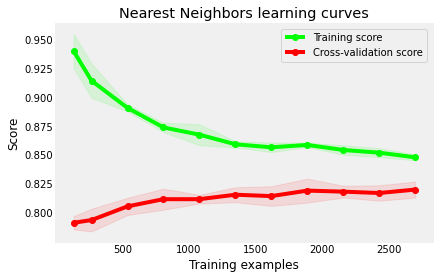

In [104]:
g = plot_learning_curve(catb.grid.best_estimator_, "Nearest Neighbors learning curves", X_train, y_train,
                   cv = 5, train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


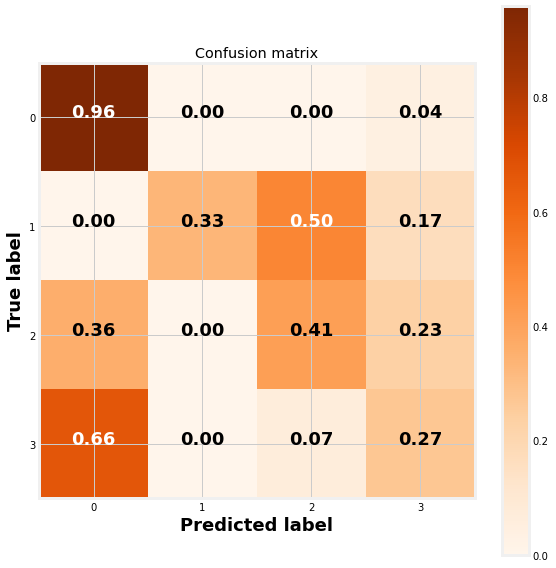

In [105]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=1)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [106]:

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.96      0.90      1125
           1       1.00      0.33      0.50         6
           3       0.63      0.41      0.50        87
           4       0.49      0.27      0.35       226

    accuracy                           0.82      1444
   macro avg       0.74      0.49      0.56      1444
weighted avg       0.79      0.82      0.79      1444



In [107]:
print(confusion_matrix(y_test,y_pred))

[[1079    0    3   43]
 [   0    2    3    1]
 [  31    0   36   20]
 [ 150    0   15   61]]


### Apply `VotingClassifier` method of the `sklearn` package 

In [108]:
xgb_best =XGBClassifier(**ltv_xgb_model.best_params_)
svc_best = svm.LinearSVC(**svc.grid.best_params_)
lr_best  = linear_model.LogisticRegression(**lr.grid.best_params_)
tr_best  = tree.DecisionTreeClassifier(**tr.grid.best_params_)
rf_best  = ensemble.RandomForestClassifier(**rf.grid.best_params_)
ada_best = ensemble.AdaBoostClassifier(**ada.grid.best_params_)
gb_best  = ensemble.GradientBoostingClassifier(**gb.grid.best_params_)
knn_best = neighbors.KNeighborsClassifier(**knn.grid.best_params_)
lgb_best = lgb.LGBMClassifier(**lbm.grid.best_params_)
catb_best= CatBoostClassifier(**catb.grid.best_params_)

In [109]:
votingC = ensemble.VotingClassifier(estimators=[('ltv_xgb_model',xgb_best),('lr',lr_best),('tr',tr_best),
                                                ('rf', rf_best), ('ada',ada_best),('gb', gb_best),                     
                                                ('knn', knn_best),('lbm', lgb_best),('catb', catb_best)], 
                                    voting='soft')


In [110]:
votingC = votingC.fit(X_train, y_train)

[00:45:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.5
0:	learn: 0.7290228	total: 8.24ms	remaining: 157ms
1:	learn: 0.6021370	total: 12.4ms	remaining: 111ms
2:	learn: 0.5398446	total: 18.4ms	remaining: 104ms
3:	learn: 0.5003519	total: 24.4ms	remaining: 97.4ms
4:	learn: 0.4775044	total: 30.3ms	remaining: 91ms
5:	learn: 0.4631430	total: 36.2ms	remaining: 84.5ms
6:	learn: 0.4526839	total: 42.1ms	remaining: 78.2ms
7:	learn: 0.4458416	total: 48.7ms	remaining: 73ms
8:	learn: 0.4403390	total: 55ms	remaining: 67.2ms
9:	learn: 0.4345067	total: 61.4ms	remaining: 61.4ms
10:	learn: 0.4314704	total: 66.3ms	remaining: 54.2ms
11:	learn: 0.4272013	total: 70.5ms	remaining: 47ms
12:	learn: 0.4233121	total: 74.8ms	remaining: 40.

In [111]:
predictions = votingC.predict(X_test)
print("Precision: {:.2f} % ".format(100*metrics.accuracy_score(y_test, predictions)))

Precision: 81.65 % 


Note that when defining the `votingC` classifier, I only used a sub-sample of the whole set of classifiers defined above and only retained the *Random Forest*, the *k-Nearest Neighbors* and the *Gradient Boosting* classifiers. In practice, this choice has been done with respect to the performance of the classification carried out in the next section.

___
## 6. Testing predictions

In the previous section, a few classifiers were trained in order to categorize customers. Until that point, the whole analysis was based on the data of the first 10 months. In this section, I test the model  the last two months of the dataset, that has been stored in the `set_test` dataframe:

In [112]:
classifiers = [(svc, 'Support Vector Machine'),(lr, 'Logostic Regression'),(tr, 'Decision Tree'),
                                              (rf, 'Random Forest'), (ada,"Ada Boost"),(gb, 'Gradient Boosting'),                     
                                               (knn, 'k-Nearest Neighbors'),(lbm, 'lg boost'),(catb, 'cat boost')]
#______________________________
for clf1, label in classifiers:
    print(30*'_', '\n{}'.format(label))
    clf1.grid_predict(X_test,y_test)

______________________________ 
Support Vector Machine
Precision: 80.26 % 
______________________________ 
Logostic Regression
Precision: 82.13 % 
______________________________ 
Decision Tree
Precision: 73.48 % 
______________________________ 
Random Forest
Precision: 81.16 % 
______________________________ 
Ada Boost
Precision: 79.85 % 
______________________________ 
Gradient Boosting
Precision: 82.13 % 
______________________________ 
k-Nearest Neighbors
Precision: 81.09 % 
______________________________ 
lg boost
Precision: 81.79 % 
______________________________ 
cat boost
Precision: 81.58 % 


In [113]:
voting_clf = ensemble.VotingClassifier(estimators=[('ltv_xgb_model',xgb_best),('lr',lr_best),('tr',tr_best),
                                                ('rf', rf_best), ('ada',ada_best),('gb', gb_best),                     
                                                ('knn', knn_best),('lbm', lgb_best),('catb', catb_best)], 
                                    voting='soft')


#fit and predict using training and testing dataset respectively
voting_clf.fit(X_train, y_train)
predictions = voting_clf.predict(X_test)
#Evaluation matrics

[00:45:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.5
0:	learn: 0.7290228	total: 8.33ms	remaining: 158ms
1:	learn: 0.6021370	total: 12.2ms	remaining: 110ms
2:	learn: 0.5398446	total: 18.3ms	remaining: 103ms
3:	learn: 0.5003519	total: 24.2ms	remaining: 96.8ms
4:	learn: 0.4775044	total: 30.4ms	remaining: 91.2ms
5:	learn: 0.4631430	total: 36.1ms	remaining: 84.2ms
6:	learn: 0.4526839	total: 42.3ms	remaining: 78.5ms
7:	learn: 0.4458416	total: 48.7ms	remaining: 73ms
8:	learn: 0.4403390	total: 55ms	remaining: 67.2ms
9:	learn: 0.4345067	total: 59.2ms	remaining: 59.2ms
10:	learn: 0.4314704	total: 63.6ms	remaining: 52.1ms
11:	learn: 0.4272013	total: 67.8ms	remaining: 45.2ms
12:	learn: 0.4233121	total: 71.9ms	remaining:

In [114]:
y_pred = predictions
y_pred1 = voting_clf.predict(X_train)

score_list.append('Voting classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('Voting classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('Voting  classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('Voting  classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

In [115]:

print(confusion_matrix(y_test,predictions))

print(classification_report(y_test,predictions))



[[1092    0    2   31]
 [   0    3    2    1]
 [  31    0   30   26]
 [ 154    0   11   61]]
              precision    recall  f1-score   support

           0       0.86      0.97      0.91      1125
           1       1.00      0.50      0.67         6
           3       0.67      0.34      0.45        87
           4       0.51      0.27      0.35       226

    accuracy                           0.82      1444
   macro avg       0.76      0.52      0.60      1444
weighted avg       0.79      0.82      0.79      1444



Normalized confusion matrix


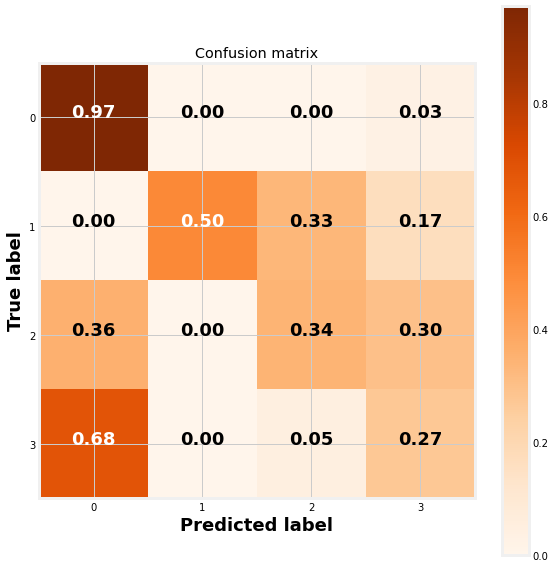

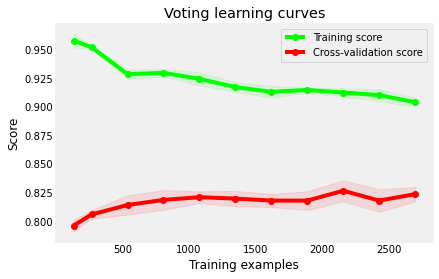

In [116]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,predictions) 
np.set_printoptions(precision=1)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')


g = plot_learning_curve(voting_clf, "Voting learning curves", X_train, y_train,
                   cv = 5, train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

In [117]:
score_list

['XGB classifier Precision on training set: 0.87 & test data 0.88',
 'XGB classifier Recall    on training set: 0.88 & test data 0.88',
 'XGB classifier F1 score  on training set: 0.87 & test data 0.87',
 'XGB classifier Accuracy  on training set: 0.88 & test data 0.88',
 'Svc classifier Precision on training set: 0.76 & test data 0.75',
 'Svc classifier Recall    on training set: 0.81 & test data 0.80',
 'Svc classifier F1 score  on training set: 0.75 & test data 0.75',
 'Svc classifier Accuracy  on training set: 0.81 & test data 0.80',
 'LR classifier Precision on training set: 0.80 & test data 0.79',
 'LR classifier Recall    on training set: 0.83 & test data 0.82',
 'LR classifier F1 score  on training set: 0.80 & test data 0.80',
 'LR classifier Accuracy  on training set: 0.83 & test data 0.82',
 'DT classifier Precision on training set: 1.00 & test data 0.74',
 'DT classifier Recall    on training set: 1.00 & test data 0.73',
 'DT classifier F1 score  on training set: 1.00 & test

In [118]:
predictions = votingC.predict(X)
print("Precision: {:.2f} % ".format(100*metrics.accuracy_score(y, predictions)))

Precision: 87.53 % 


### <font color='blue'> Model explainaility </font>

In [119]:
X_Xai=X.copy(deep=True)

In [120]:
X_Xai['Predicted_Labels'] =predictions

In [121]:
X_Xai.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,Predicted_Labels
0,12346,341,37,311.37,4,0
1,12413,146,22,369.00,1,0
2,12426,104,73,1086.86,1,0
3,12427,261,8,112.65,4,0
4,12437,8,361,5914.65,2,3


In [122]:
df_first_sec_yr_group.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster
0,12346,341,37,311.37,4,0.00,0
1,12413,146,22,369.00,1,176.20,0
2,12426,104,73,1086.86,1,0.00,0
3,12427,261,8,112.65,4,262.36,0
4,12437,8,361,5914.65,2,1482.48,3


<font color='blue'>Prepare data to explane the model, Voting classifier will be used for explaining the model</font>

In [123]:
df_ouput=pd.merge(df_first_sec_yr_group,X_Xai[['Customer ID','Predicted_Labels']], on='Customer ID', how='left')

In [124]:
df_ouput.isnull().sum()

Customer ID           0
Recency               0
Frequency             0
Monetary              0
source_CLV_cluster    0
3mnth_Revenue         0
target_CLV_cluster    0
Predicted_Labels      0
dtype: int64

In [125]:
#gmm_cluster_id is GMM output, CLV_Cluster is based on m9_Revenue
df_ouput.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster,Predicted_Labels
0,12346,341,37,311.37,4,0.00,0,0
1,12413,146,22,369.00,1,176.20,0,0
2,12426,104,73,1086.86,1,0.00,0,0
3,12427,261,8,112.65,4,262.36,0,0
4,12437,8,361,5914.65,2,1482.48,3,3


In [126]:
df_ouput.groupby('source_CLV_cluster')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

,Monetary,Frequency,Recency
source_CLV_cluster,,,
3,13500.177692,1415.707692,32.261538
2,3422.352162,319.801504,74.455639
1,683.523664,58.095192,84.521612
4,421.323047,41.082521,312.159790
0,240.883896,24.163531,523.396527


In [127]:
df_ouput.groupby('target_CLV_cluster')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

,Monetary,Frequency,Recency
target_CLV_cluster,,,
2,51876.365000,3133.000000,1.000000
1,17602.440000,1991.095238,23.571429
3,4407.995880,437.197880,57.579505
4,1861.501777,160.067270,90.576973
0,570.170776,53.623192,245.476165


In [128]:
df_ouput.groupby('Predicted_Labels')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

,Monetary,Frequency,Recency
Predicted_Labels,,,
2,51876.365000,3133.000000,1.000000
1,20122.658125,2421.500000,26.187500
3,6324.903399,619.278689,36.420765
4,2949.831029,246.214602,45.513274
0,570.271430,54.360577,234.557212


In [129]:
df_ouput['Customer ID'].groupby(df_ouput['source_CLV_cluster']).count()

source_CLV_cluster
0    691 
1    2059
2    665 
3    65  
4    1333
Name: Customer ID, dtype: int64

In [130]:
df_ouput['Customer ID'].groupby(df_ouput['target_CLV_cluster']).count()

target_CLV_cluster
0    3734
1    21  
2    2   
3    283 
4    773 
Name: Customer ID, dtype: int64

In [131]:
df_ouput['Customer ID'].groupby(df_ouput['Predicted_Labels']).count()

Predicted_Labels
0    4160
1    16  
2    2   
3    183 
4    452 
Name: Customer ID, dtype: int64

In [132]:
Segment=['High_CLV','Good_CLV','Average_CLV','Low_CLV','Poor_CLV']

In [133]:
temp=df_ouput.groupby('source_CLV_cluster')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

for i in range(len(temp.index)):
    df_ouput.loc[df_ouput['source_CLV_cluster']==temp.index[i],'Original_GMM_Segment'] =Segment[i]   

In [134]:
temp=df_ouput.groupby('target_CLV_cluster')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

for i in range(len(temp.index)):
    df_ouput.loc[df_ouput['target_CLV_cluster']==temp.index[i],'Future_Realistic_GMM_segment'] =Segment[i]

In [135]:
temp=df_ouput.groupby('Predicted_Labels')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

for i in range(len(temp.index)):
    df_ouput.loc[df_ouput['Predicted_Labels']==temp.index[i],'Predicted_segment'] =Segment[i]

In [136]:
df_ouput.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster,Predicted_Labels,Original_GMM_Segment,Future_Realistic_GMM_segment,Predicted_segment
0,12346,341,37,311.37,4,0.00,0,0,Low_CLV,Poor_CLV,Poor_CLV
1,12413,146,22,369.00,1,176.20,0,0,Average_CLV,Poor_CLV,Poor_CLV
2,12426,104,73,1086.86,1,0.00,0,0,Average_CLV,Poor_CLV,Poor_CLV
3,12427,261,8,112.65,4,262.36,0,0,Low_CLV,Poor_CLV,Poor_CLV
4,12437,8,361,5914.65,2,1482.48,3,3,Good_CLV,Average_CLV,Average_CLV


In [137]:
df_ouput['Customer ID'].groupby(df_ouput['Original_GMM_Segment']).count()

Original_GMM_Segment
Average_CLV    2059
Good_CLV       665 
High_CLV       65  
Low_CLV        1333
Poor_CLV       691 
Name: Customer ID, dtype: int64

In [138]:
df_ouput['Customer ID'].groupby(df_ouput['Future_Realistic_GMM_segment']).count() 

Future_Realistic_GMM_segment
Average_CLV    283 
Good_CLV       21  
High_CLV       2   
Low_CLV        773 
Poor_CLV       3734
Name: Customer ID, dtype: int64

In [139]:
df_ouput['Customer ID'].groupby(df_ouput['Predicted_segment']).count() 

Predicted_segment
Average_CLV    183 
Good_CLV       16  
High_CLV       2   
Low_CLV        452 
Poor_CLV       4160
Name: Customer ID, dtype: int64

In [140]:
df_ouput.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster,Predicted_Labels,Original_GMM_Segment,Future_Realistic_GMM_segment,Predicted_segment
0,12346,341,37,311.37,4,0.00,0,0,Low_CLV,Poor_CLV,Poor_CLV
1,12413,146,22,369.00,1,176.20,0,0,Average_CLV,Poor_CLV,Poor_CLV
2,12426,104,73,1086.86,1,0.00,0,0,Average_CLV,Poor_CLV,Poor_CLV
3,12427,261,8,112.65,4,262.36,0,0,Low_CLV,Poor_CLV,Poor_CLV
4,12437,8,361,5914.65,2,1482.48,3,3,Good_CLV,Average_CLV,Average_CLV


In [141]:
df_ouput_XAI = df_ouput.copy(deep=True)

df_ouput_XAI=df_ouput_XAI[['Customer ID','Recency','Frequency','Monetary','source_CLV_cluster','3mnth_Revenue','target_CLV_cluster','Future_Realistic_GMM_segment','Predicted_segment']]
df_ouput_XAI.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster,Future_Realistic_GMM_segment,Predicted_segment
0,12346,341,37,311.37,4,0.00,0,Poor_CLV,Poor_CLV
1,12413,146,22,369.00,1,176.20,0,Poor_CLV,Poor_CLV
2,12426,104,73,1086.86,1,0.00,0,Poor_CLV,Poor_CLV
3,12427,261,8,112.65,4,262.36,0,Poor_CLV,Poor_CLV
4,12437,8,361,5914.65,2,1482.48,3,Average_CLV,Average_CLV


In [142]:
data= np.array(df_ouput_XAI.drop(['Customer ID','source_CLV_cluster','target_CLV_cluster'],axis=1)) 

In [143]:
#temp=pd.DataFrame(data)
#temp.sort_values(5)

In [144]:
feature_names = ['Recency', 'Frequency', 'Monetary','3mnth_Revenue', 'Future_Realistic_GMM_segment']
feature_names

['Recency',
 'Frequency',
 'Monetary',
 '3mnth_Revenue',
 'Future_Realistic_GMM_segment']

In [145]:
labels = data[:,5]
labels

array(['Poor_CLV', 'Poor_CLV', 'Poor_CLV', ..., 'Poor_CLV', 'Poor_CLV',
       'Poor_CLV'], dtype=object)

In [146]:
data=data[:,:-1]

In [147]:
le= preprocessing.LabelEncoder()
le.fit(labels)

LabelEncoder()

In [148]:
class_names = le.classes_
class_names

array(['Average_CLV', 'Good_CLV', 'High_CLV', 'Low_CLV', 'Poor_CLV'],
      dtype=object)

In [149]:
categorical_features = [4]
categorical_names = {}
for feature in categorical_features:
    le = preprocessing.LabelEncoder()
    le.fit(data[:, feature])
    data[:, feature] = le.transform(data[:, feature])
    categorical_names[feature] = le.classes_

In [150]:
data = data.astype(float)

In [151]:
encoder = ColumnTransformer(  [('one_hot_encoder', OneHotEncoder(categories='auto',handle_unknown = "ignore"), [0,1])],\
                            remainder='passthrough'  )

In [152]:
np.random.seed(1)
train, test, labels_train, labels_test = model_selection.train_test_split(data, labels, train_size=0.30)

In [153]:
encoder.fit(data)
encoded_train = encoder.transform(train)

In [154]:
votingC = votingC.fit(encoded_train, labels_train)

[00:45:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.5
0:	learn: 0.4911831	total: 19.4ms	remaining: 368ms
1:	learn: 0.3283688	total: 22.4ms	remaining: 202ms
2:	learn: 0.2445433	total: 32.1ms	remaining: 182ms
3:	learn: 0.1928279	total: 39.2ms	remaining: 157ms
4:	learn: 0.1633871	total: 46.1ms	remaining: 138ms
5:	learn: 0.1497641	total: 52.5ms	remaining: 123ms
6:	learn: 0.1372954	total: 59.4ms	remaining: 110ms
7:	learn: 0.1308974	total: 65.7ms	remaining: 98.6ms
8:	learn: 0.1268751	total: 72.5ms	remaining: 88.6ms
9:	learn: 0.1230530	total: 79.1ms	remaining: 79.1ms
10:	learn: 0.1164603	total: 85.4ms	remaining: 69.8ms
11:	learn: 0.1124987	total: 91.7ms	remaining: 61.2ms
12:	learn: 0.1091233	total: 98ms	remaining: 5

In [155]:
votingC.fit(encoded_train, labels_train)

[00:45:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.5
0:	learn: 0.4911831	total: 14ms	remaining: 267ms
1:	learn: 0.3283688	total: 17ms	remaining: 153ms
2:	learn: 0.2445433	total: 26.7ms	remaining: 151ms
3:	learn: 0.1928279	total: 37.8ms	remaining: 151ms
4:	learn: 0.1633871	total: 45.5ms	remaining: 137ms
5:	learn: 0.1497641	total: 52.6ms	remaining: 123ms
6:	learn: 0.1372954	total: 59.7ms	remaining: 111ms
7:	learn: 0.1308974	total: 66.4ms	remaining: 99.6ms
8:	learn: 0.1268751	total: 73.3ms	remaining: 89.6ms
9:	learn: 0.1230530	total: 80.3ms	remaining: 80.3ms
10:	learn: 0.1164603	total: 86.9ms	remaining: 71.1ms
11:	learn: 0.1124987	total: 94.2ms	remaining: 62.8ms
12:	learn: 0.1091233	total: 101ms	remaining: 54.5

VotingClassifier(estimators=[('ltv_xgb_model',
                              XGBClassifier(base_score=None, booster=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, gamma=None,
                                            gpu_id=None, importance_type='gain',
                                            interaction_constraints=None,
                                            learning_rate=0.1,
                                            max_delta_step=None, max_depth=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_esti...
                                                     max_features='log2')),
                             ('rf',
                              RandomForestClassi

In [156]:
metrics.accuracy_score(labels_test, votingC.predict(encoder.transform(test)))

0.9504451038575668

In [157]:
precision_score(labels_test,votingC.predict(encoder.transform(test)), average='weighted')

0.9468813435346738

In [171]:
predict_fn = lambda x: votingC.predict_proba(encoder.transform(x)).astype(float)

In [172]:
explainer = lime.lime_tabular.LimeTabularExplainer(train ,feature_names = feature_names,class_names=class_names,
                                                   categorical_features=categorical_features, 
                                                   categorical_names=categorical_names, kernel_width=3)

In [160]:
temp=pd.DataFrame(data)
temp.sort_values(4,ascending=False)

,0,1,2,3,4
0,341.0,37.0,3.113700e+02,0.000,4.0
3039,145.0,17.0,1.781900e+02,0.000,4.0
3020,633.0,16.0,3.232500e+02,0.000,4.0
3021,398.0,4.0,9.330000e+01,0.000,4.0
3022,379.0,66.0,1.184560e+03,0.000,4.0
3023,347.0,14.0,3.815100e+02,286.281,4.0
3024,381.0,1.0,2.970000e+01,0.000,4.0
3027,270.0,97.0,1.615520e+03,0.000,4.0
3028,57.0,51.0,6.451300e+02,214.600,4.0
3031,34.0,203.0,1.893800e+03,127.200,4.0


In [161]:
df_ouput[df_ouput['Future_Realistic_GMM_segment'] != df_ouput['Predicted_segment' ]].sort_values('Predicted_segment')

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster,Predicted_Labels,Original_GMM_Segment,Future_Realistic_GMM_segment,Predicted_segment
2259,15281,46,436,6494.190,2,140.37,0,3,Good_CLV,Poor_CLV,Average_CLV
286,12949,24,559,10554.490,3,566.80,4,3,High_CLV,Low_CLV,Average_CLV
4327,17716,4,436,8044.230,2,747.18,4,3,Good_CLV,Low_CLV,Average_CLV
4289,17675,11,564,10579.270,3,2898.57,1,3,High_CLV,Good_CLV,Average_CLV
4245,17625,50,540,4407.320,2,685.07,4,3,Good_CLV,Low_CLV,Average_CLV
971,13767,18,422,8169.450,2,800.56,4,3,Good_CLV,Low_CLV,Average_CLV
3850,17160,19,589,9077.010,2,516.85,4,3,Good_CLV,Low_CLV,Average_CLV
3549,16814,18,597,6628.740,2,627.57,4,3,Good_CLV,Low_CLV,Average_CLV
1525,14426,50,497,7070.620,2,463.67,4,3,Good_CLV,Low_CLV,Average_CLV
1555,14461,58,556,4945.630,2,0.00,0,3,Good_CLV,Poor_CLV,Average_CLV


15281 Customer was in Good_CLV segment and in Poor_CLV for next 90 days, and its predicted as Average_CLV for next 90 days


12949 Customer was in High_CLV segment and in Low_CLV for next 90 days, and its predicted as Average_CLV for next 90 days


17675 Customer was in High_CLV segment and in Good_CLV for next 90 days, and its predicted as Average_CLV for next 90 days


14367 Customer was in Good_CLV segment and in Average_CLV for next 90 days, and its predicted as Low_CLV for next 90 days


13014 Customer was in Good_CLV segment and in Low_CLV for next 90 days, and its predicted as Poor_CLV for next 90 days


14096 Customer was in Average_CLV segment and in High_CLV for next 90 days, and its predicted as High_CLV for next 90 days


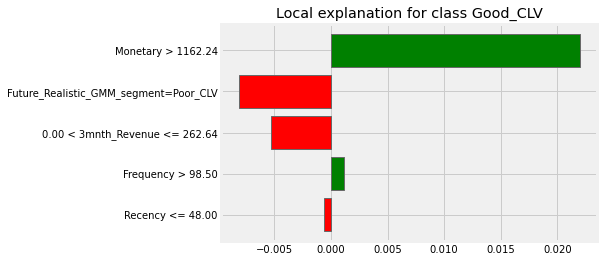

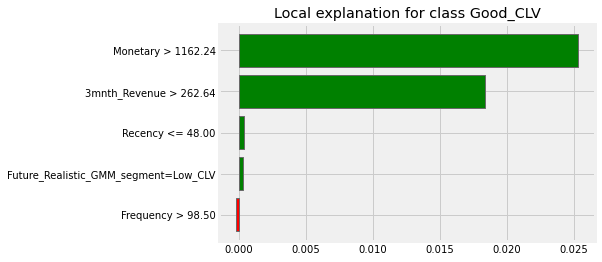

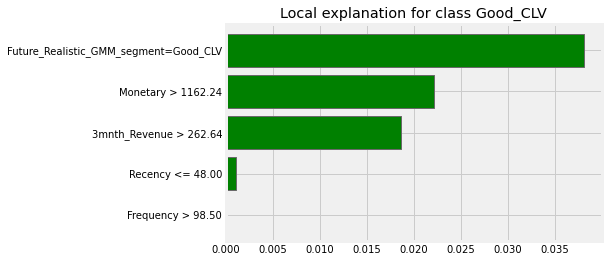

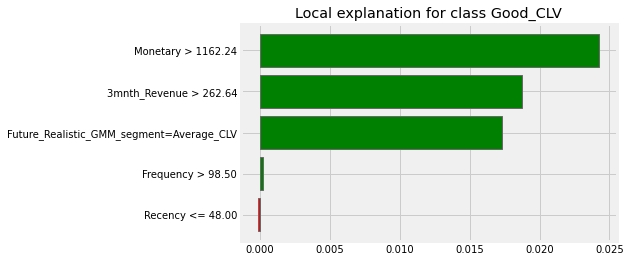

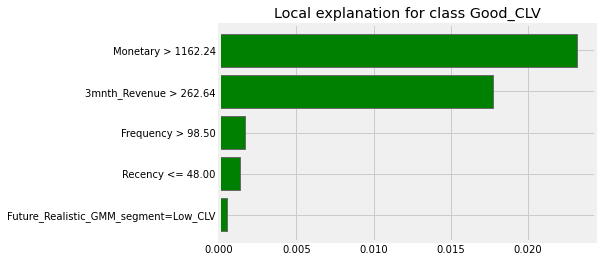

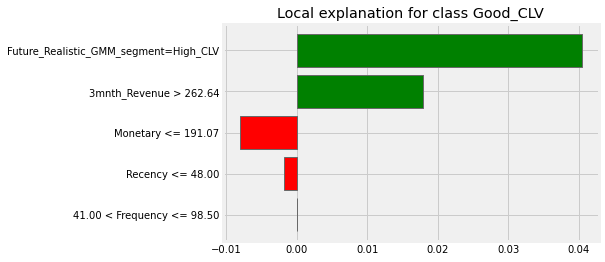

In [174]:
lime_list=[2259,286,4289,1472,341,1246 ]
 
for i in lime_list:
    print(df_ouput.iloc[i]['Customer ID'], "Customer was in", df_ouput.iloc[i].Original_GMM_Segment  , \
          "segment and in", df_ouput.iloc[i].Future_Realistic_GMM_segment ,"for next 90 days, and its predicted as" ,\
          df_ouput.iloc[i].Predicted_segment,"for next 90 days"  )
    exp = explainer.explain_instance(data[i], predict_fn) 
    exp.show_in_notebook(show_all=False)
    exp.as_pyplot_figure()

___
#### Using SHAP
 

In [163]:
import shap
y_prob = df_first_sec_yr_group["target_CLV_cluster"]

ltv_xgb_model = XGBClassifier( objective="multi:softprob", random_state =123 ,eval_metric='mlogloss')

ltv_xgb_model.fit(X,y_prob)
y_pred = ltv_xgb_model.predict(X_test)

explainer = shap.TreeExplainer(ltv_xgb_model)

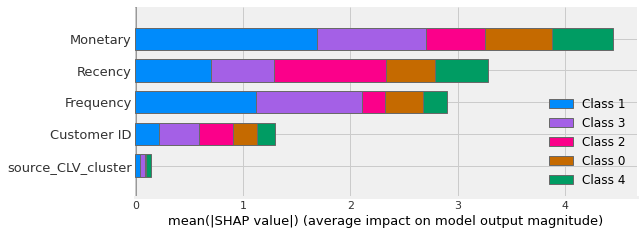

In [164]:
explainer = shap.TreeExplainer(ltv_xgb_model)
shap_values = explainer.shap_values(X,approximate=False)
shap.summary_plot(shap_values, X, plot_type="bar")

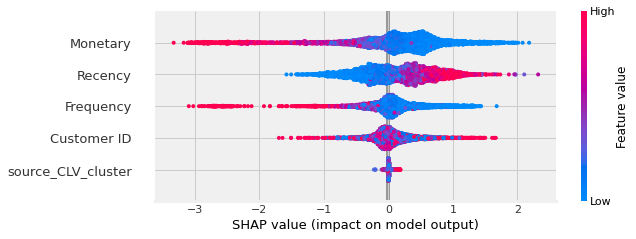

In [165]:
shap.summary_plot(shap_values[0], X)

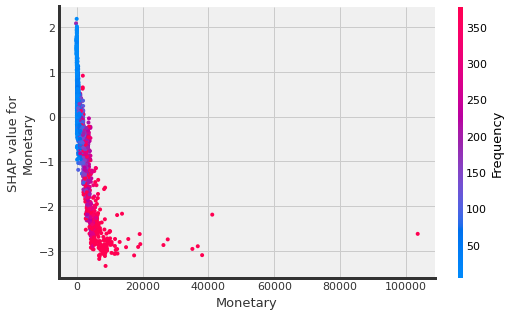

In [166]:
shap.dependence_plot("Monetary", shap_values[0], X)

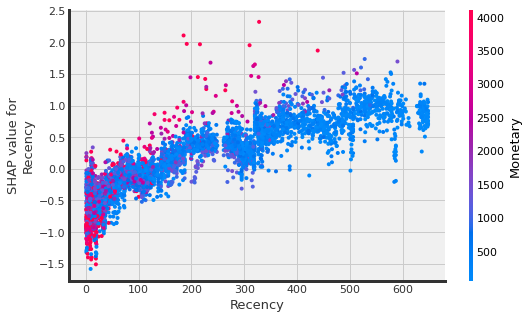

In [167]:
shap.dependence_plot("Recency", shap_values[0], X)

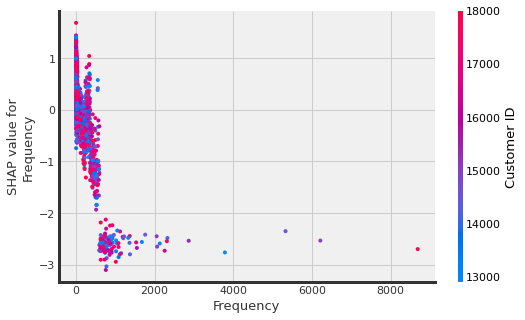

In [168]:
shap.dependence_plot("Frequency", shap_values[0], X)

#### Conclusion - Voting classifer has produced good result, but there is a need to fine tune the models further to achieve better accuracy on the test data